In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Cargar los datos del catálogo
cat_directory = './data/lunar/training/catalogs/'
cat_file = cat_directory + 'apollo12_catalog_GradeA_final.csv'
cat = pd.read_csv(cat_file)

# Cargar los datos de la señal sísmica de entrenamiento
data_train_directory = './data/lunar/training/data/S12_GradeA/'

# Listas para almacenar los datos de entrenamiento cargados
all_train_csv_times = []
all_train_csv_data = []
arrival_times = []  # Lista para almacenar los tiempos de llegada

# Iterar sobre cada fila en el catálogo para cargar datos de entrenamiento
for index, row in cat.iterrows():
    test_filename = row['filename'].strip()  # Limpiar cualquier espacio en blanco
    arrival_time_rel = row['time_rel(sec)']  # Tiempo de llegada

    # Crear la ruta completa del archivo CSV
    csv_file = f'{data_train_directory}{test_filename}.csv'
    
    try:
        # Cargar el archivo CSV correspondiente
        data_cat = pd.read_csv(csv_file)

        # Leer pasos de tiempo y velocidades
        csv_times = np.array(data_cat['time_rel(sec)'].tolist())
        csv_data = np.array(data_cat['velocity(m/s)'].tolist())
        
        # Verificar si las longitudes son las mismas antes de añadir
        if len(csv_times) == len(csv_data):
            all_train_csv_times.append(csv_times)
            all_train_csv_data.append(csv_data)
            arrival_times.append(arrival_time_rel)  # Añadir tiempo de llegada
            
            print(f'Cargado (Entrenamiento): {test_filename}')
        else:
            print(f'Longitudes no coinciden (Entrenamiento): {test_filename}')
    
    except FileNotFoundError:
        print(f'Archivo no encontrado (Entrenamiento): {csv_file}')
    except Exception as e:
        print(f'Error al procesar (Entrenamiento) {csv_file}: {e}')

# Convertir las listas a arreglos de NumPy como objetos
all_train_csv_times = np.array(all_train_csv_times, dtype=object)
all_train_csv_data = np.array(all_train_csv_data, dtype=object)
arrival_times = np.array(arrival_times)

# Imprimir las formas de los arreglos resultantes
print(f'Forma de all_train_csv_times: {all_train_csv_times.shape}')
print(f'Forma de all_train_csv_data: {all_train_csv_data.shape}')
print(f'Forma de arrival_times: {arrival_times.shape}')



Cargado (Entrenamiento): xa.s12.00.mhz.1970-01-19HR00_evid00002
Cargado (Entrenamiento): xa.s12.00.mhz.1970-03-25HR00_evid00003
Cargado (Entrenamiento): xa.s12.00.mhz.1970-03-26HR00_evid00004
Cargado (Entrenamiento): xa.s12.00.mhz.1970-04-25HR00_evid00006
Cargado (Entrenamiento): xa.s12.00.mhz.1970-04-26HR00_evid00007
Cargado (Entrenamiento): xa.s12.00.mhz.1970-06-15HR00_evid00008
Cargado (Entrenamiento): xa.s12.00.mhz.1970-06-26HR00_evid00009
Cargado (Entrenamiento): xa.s12.00.mhz.1970-07-20HR00_evid00010
Cargado (Entrenamiento): xa.s12.00.mhz.1970-07-20HR00_evid00011
Cargado (Entrenamiento): xa.s12.00.mhz.1970-09-26HR00_evid00013
Cargado (Entrenamiento): xa.s12.00.mhz.1970-10-24HR00_evid00014
Cargado (Entrenamiento): xa.s12.00.mhz.1970-11-12HR00_evid00015
Cargado (Entrenamiento): xa.s12.00.mhz.1970-12-11HR00_evid00017
Cargado (Entrenamiento): xa.s12.00.mhz.1970-12-27HR00_evid00019
Cargado (Entrenamiento): xa.s12.00.mhz.1970-12-31HR00_evid00021
Cargado (Entrenamiento): xa.s12.00.mhz.1

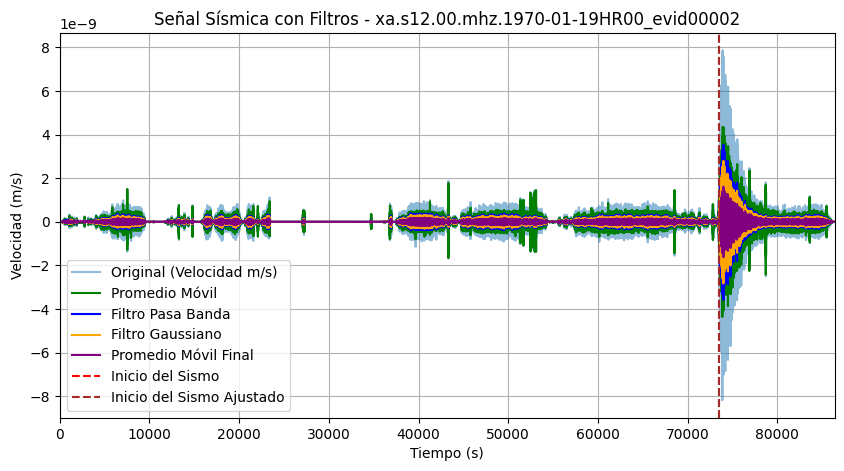

C:\Users\kevin\Documents\IA\.venv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


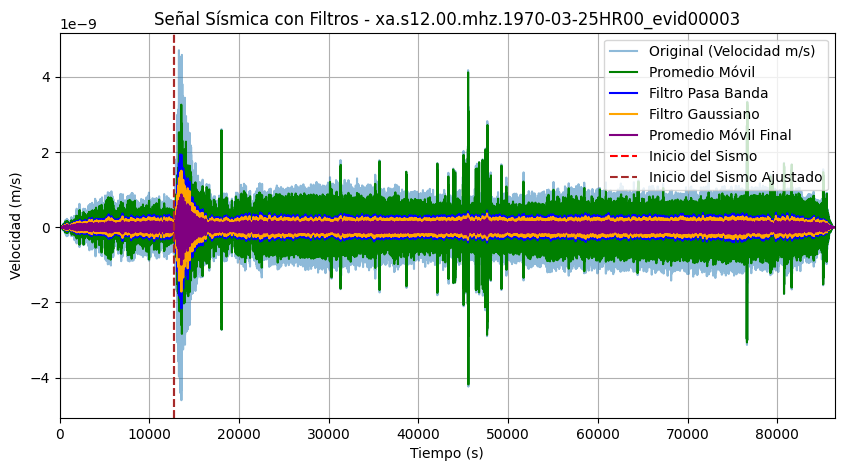

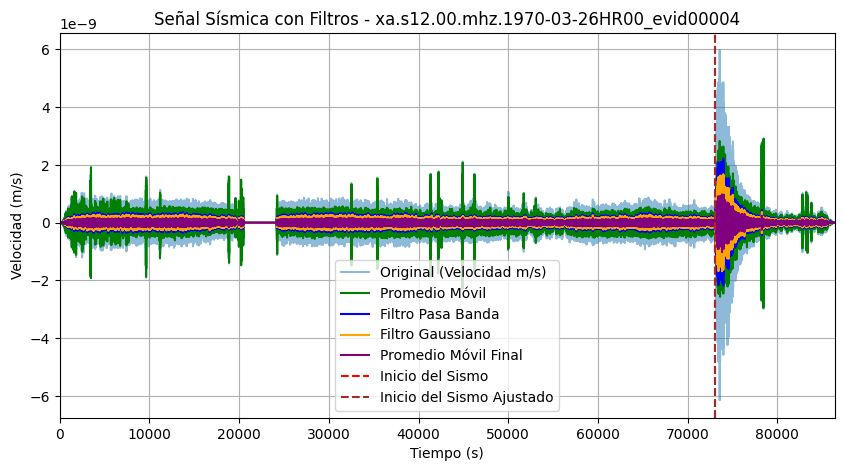

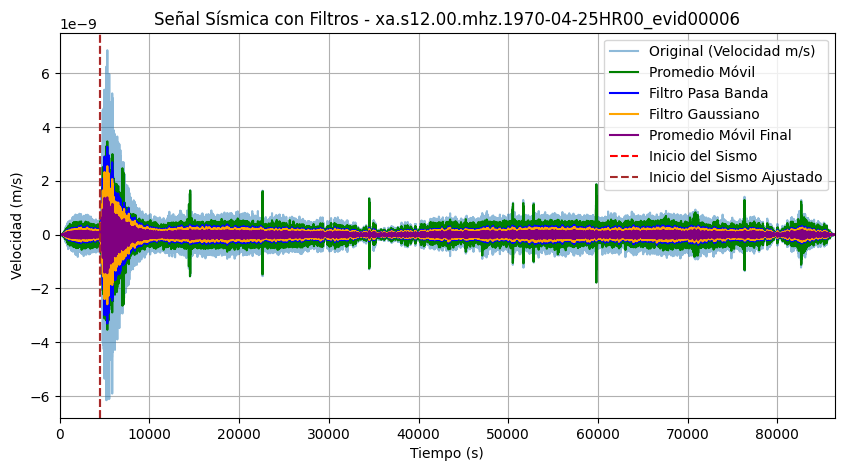

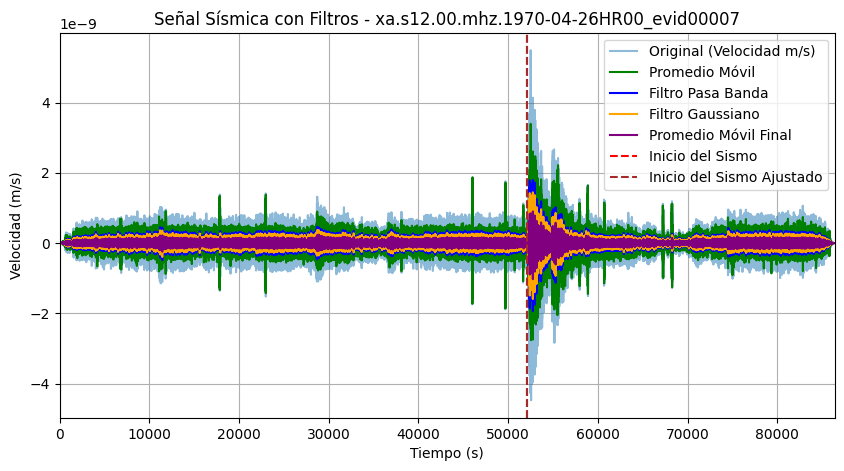

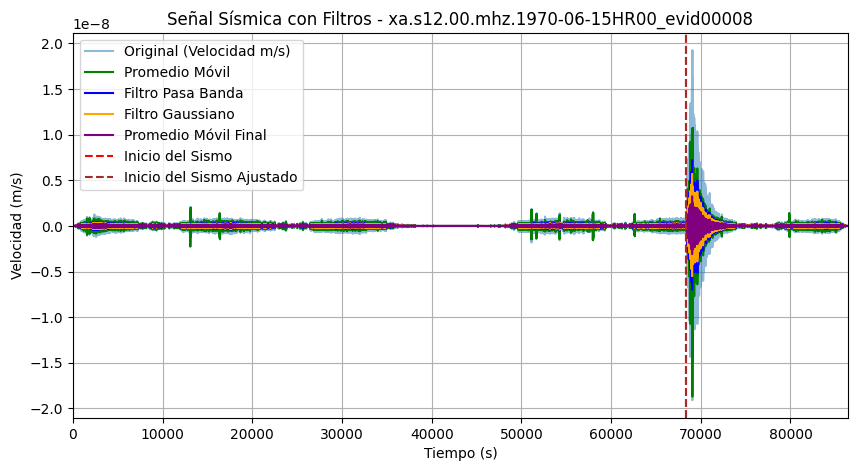

...

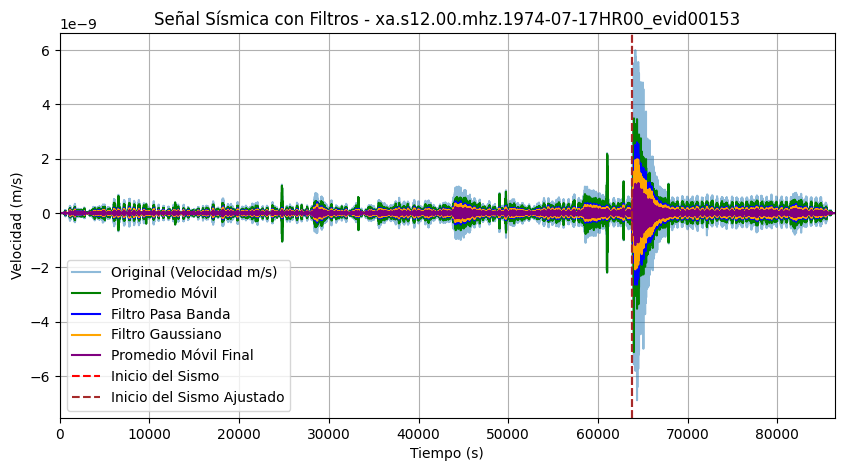

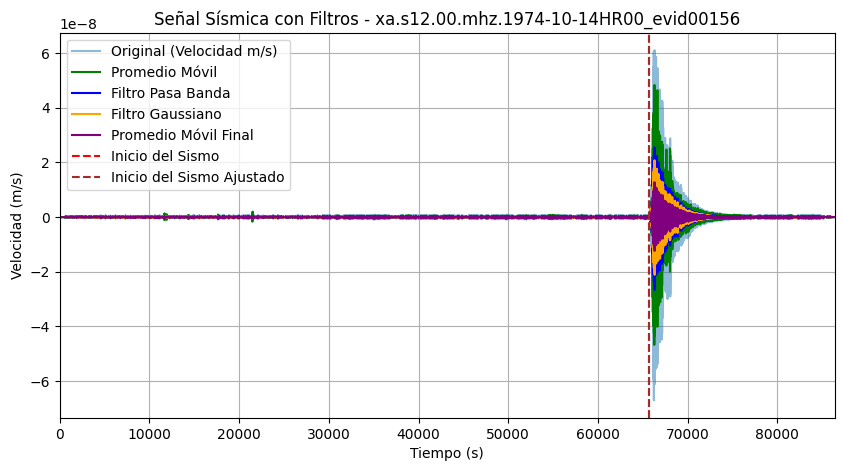

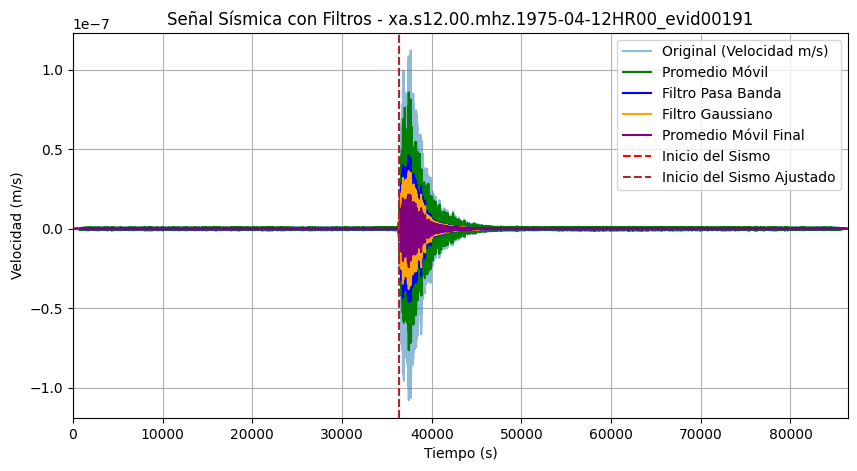

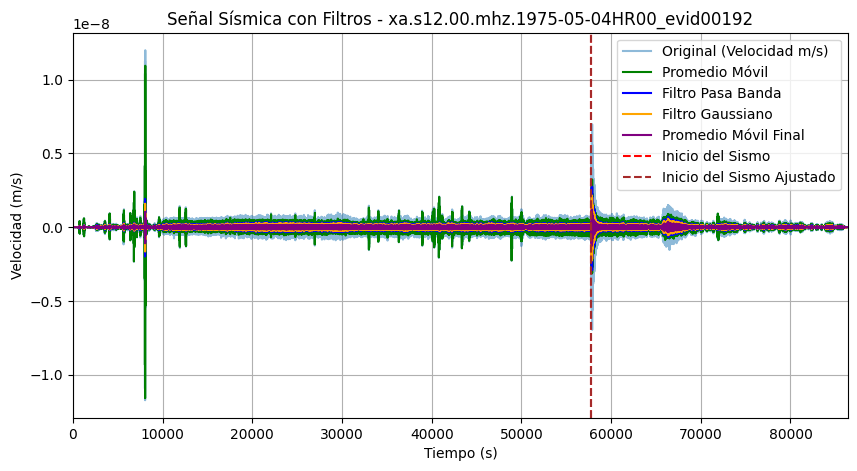

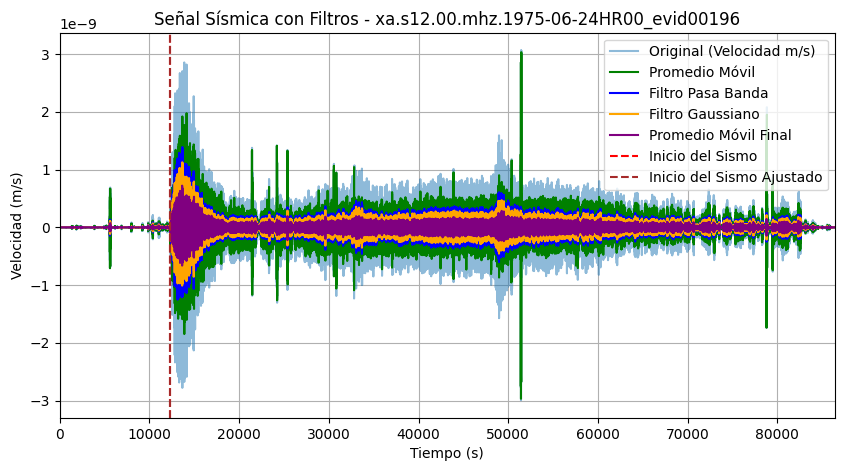

Proceso completado.


In [4]:
from scipy.signal import butter, filtfilt
from scipy.stats import norm
import numpy as np
import matplotlib.pyplot as plt
import os

# Definir el tamaño de la ventana del promedio móvil
window_size = 5  # Ajusta según sea necesario

# Función para aplicar un filtro pasa banda
def bandpass_filter(data, lowcut, highcut, fs, order=2):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data)

# Función para aplicar un filtro gaussiano
def gaussian_filter(data, sigma=1):
    kernel_size = int(4 * sigma + 1)
    kernel = norm.pdf(np.linspace(-2 * sigma, 2 * sigma, kernel_size))  # Crear el kernel gaussiano
    kernel /= np.sum(kernel)  # Normalizar el kernel
    return np.convolve(data, kernel, mode='same')

# Definir las frecuencias del filtro pasa banda
lowcut = 0.5  # Frecuencia de corte inferior
highcut = 1.0  # Frecuencia de corte superior
fs = 1.0 / (all_train_csv_times[0][1] - all_train_csv_times[0][0])  # Frecuencia de muestreo

# Crear la carpeta para guardar los datos filtrados si no existe
output_folder = 'data_filtrada1'
os.makedirs(output_folder, exist_ok=True)

# Crear la carpeta para guardar los tiempos de inicio de sismos ajustados
adjusted_arrivals_folder = 'tiempos_inicio_sismos_ajustados'
os.makedirs(adjusted_arrivals_folder, exist_ok=True)

# Graficar cada señal sísmica
for i in range(len(all_train_csv_data)):
    # Aplicar el filtro de promedio móvil
    smoothed_data = np.convolve(all_train_csv_data[i], np.ones(window_size)/window_size, mode='same')
    
    # Aplicar el filtro pasa banda
    filtered_data = bandpass_filter(smoothed_data, lowcut, highcut, fs)

    # Aplicar filtro gaussiano
    smoothed_gaussian = gaussian_filter(filtered_data, sigma=1)

    # Aplicar segundo filtro de promedio móvil con ventana de 5
    final_smoothed_data = np.convolve(smoothed_gaussian, np.ones(5)/5, mode='same')

    # Calcular el tiempo absoluto y el tiempo relativo
    time_abs = all_train_csv_times[i]
    time_rel = time_abs - time_abs[0]  # Tiempo relativo desde el inicio

    # Ajustar el tiempo de llegada del sismo
    adjusted_arrival = arrival_times[i] - time_abs[0]  # Convertir a tiempo relativo

    # Preparar los datos para guardar en el CSV
    data_to_save = np.column_stack((time_abs, time_rel, final_smoothed_data))

    plt.figure(figsize=(10, 5))
    
    # Graficar la señal original
    plt.plot(all_train_csv_times[i], all_train_csv_data[i], label='Original (Velocidad m/s)', alpha=0.5)
    
    # Graficar la señal suavizada con promedio móvil
    plt.plot(all_train_csv_times[i], smoothed_data, label='Promedio Móvil', color='green')
    
    # Graficar la señal filtrada con el filtro pasa banda
    plt.plot(all_train_csv_times[i], filtered_data, label='Filtro Pasa Banda', color='blue')
    
    # Graficar la señal suavizada con filtro gaussiano
    plt.plot(all_train_csv_times[i], smoothed_gaussian, label='Filtro Gaussiano', color='orange')
    
    # Graficar la señal final suavizada con el segundo promedio móvil
    plt.plot(all_train_csv_times[i], final_smoothed_data, label='Promedio Móvil Final', color='purple')

    # Agregar la línea de llegada del sismo
    plt.axvline(x=arrival_times[i], color='red', linestyle='--', label='Inicio del Sismo')
    
    # Agregar la línea de llegada del sismo ajustada
    plt.axvline(x=adjusted_arrival + time_abs[0], color='brown', linestyle='--', label='Inicio del Sismo Ajustado')
    
    # Títulos y etiquetas
    plt.title(f'Señal Sísmica con Filtros - {cat.iloc[i]["filename"].strip()}')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Velocidad (m/s)')
    plt.xlim([min(all_train_csv_times[i]), max(all_train_csv_times[i])])  # Ajustar los límites del eje x
    plt.legend()
    plt.grid()
    
    # Mostrar la gráfica
    plt.show()

    # Guardar los datos finales en un archivo CSV
    output_file = os.path.join(output_folder, f'{cat.iloc[i]["filename"].strip()}_filtrada.csv')
    np.savetxt(output_file, data_to_save, delimiter=',', 
               header='time_abs, time_rel, velocity', comments='')  # Guardar con las columnas deseadas   

    # Guardar el tiempo de inicio ajustado en un archivo CSV
    adjusted_arrival_file = os.path.join(adjusted_arrivals_folder, f'{cat.iloc[i]["filename"].strip()}_inicio_ajustado.csv')
    np.savetxt(adjusted_arrival_file, [adjusted_arrival], delimiter=',', header='adjusted_arrival_time', comments='')

print("Proceso completado.")


Tiempo ajustado leído: 73500
Rango de tiempo: 0.0 a 86402.11320754717
Línea de inicio del sismo graficada.


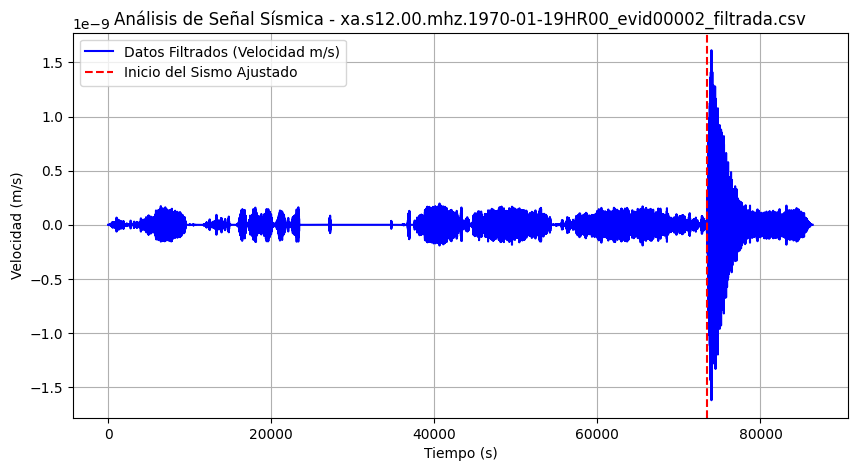

Tiempo ajustado leído: 12720
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


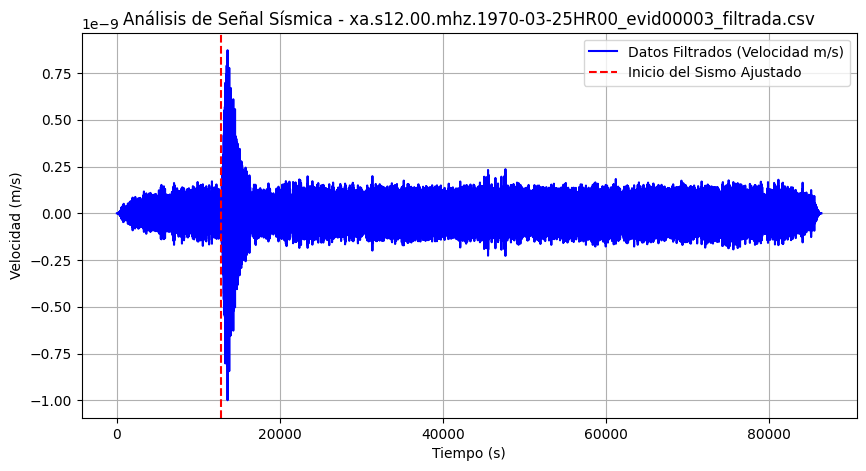

Tiempo ajustado leído: 73020
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


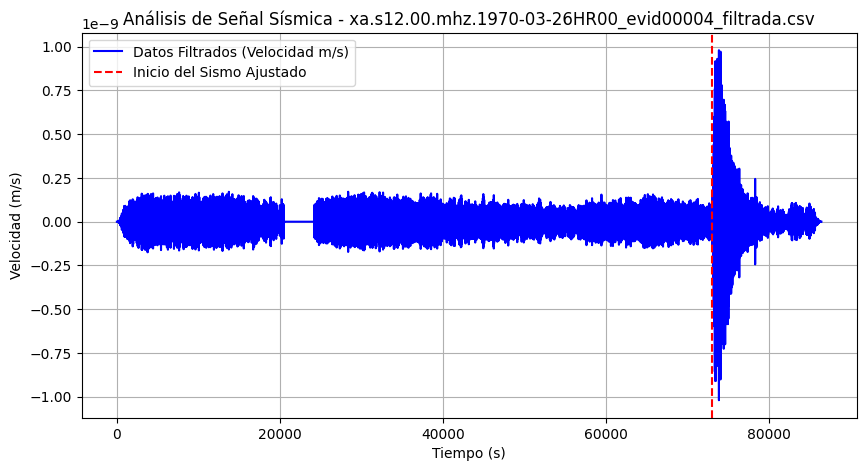

Tiempo ajustado leído: 4440
Rango de tiempo: 0.0 a 86402.11320754717
Línea de inicio del sismo graficada.


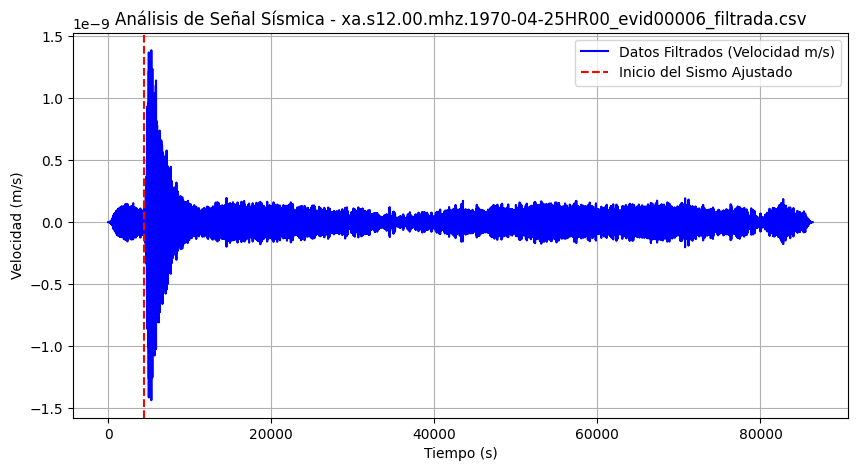

Tiempo ajustado leído: 52140
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


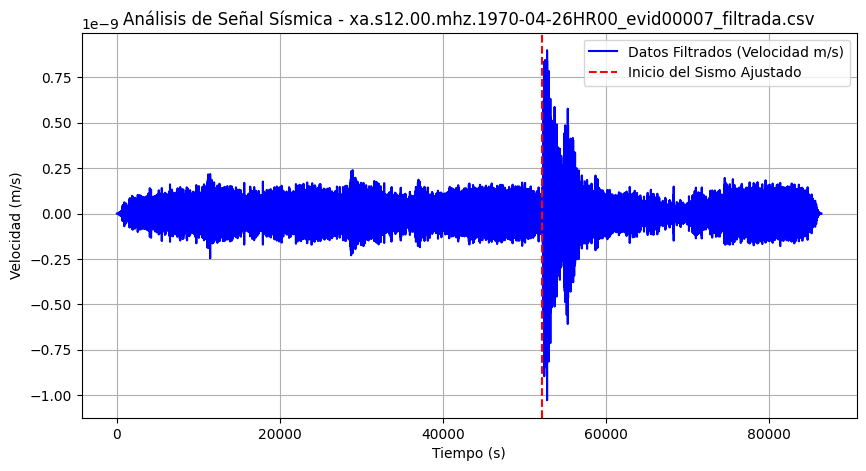

Tiempo ajustado leído: 68400
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


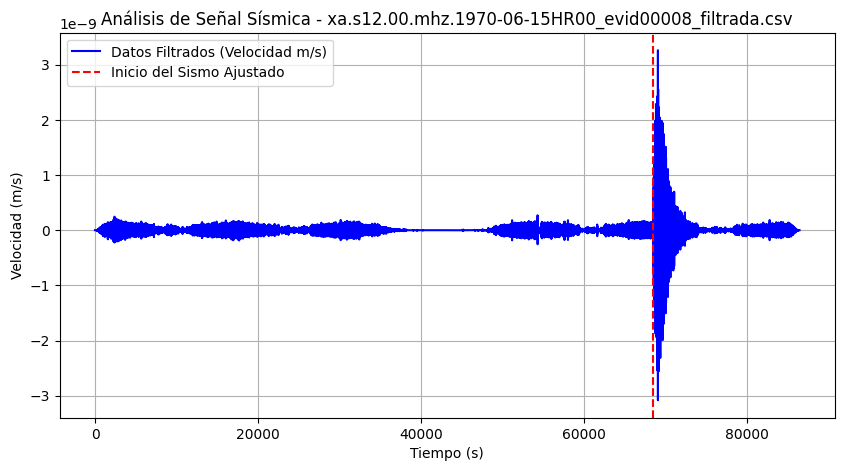

Tiempo ajustado leído: 72060
Rango de tiempo: 0.0 a 86403.32075471699
Línea de inicio del sismo graficada.


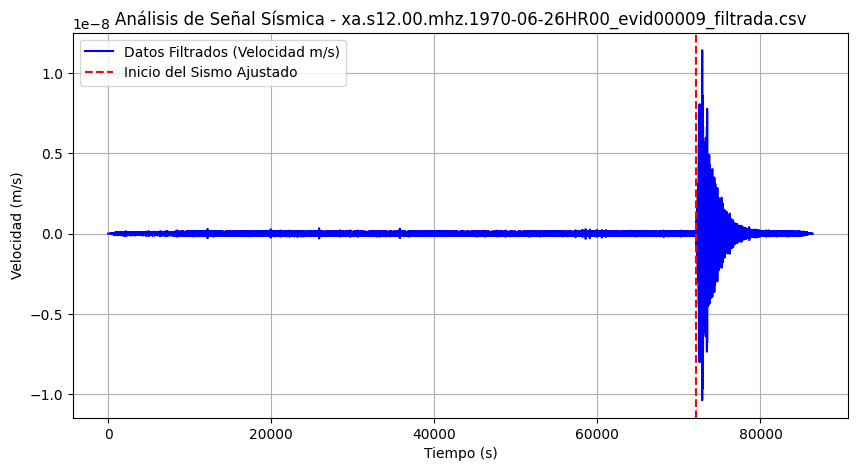

Tiempo ajustado leído: 18360
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


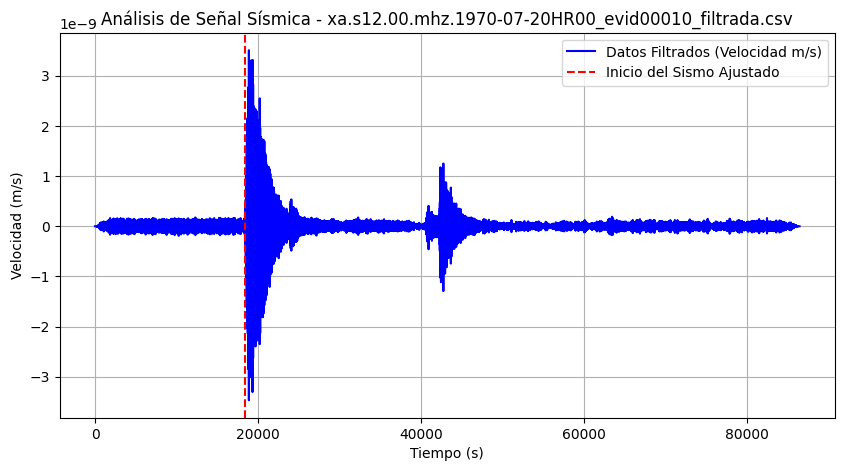

Tiempo ajustado leído: 42240
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


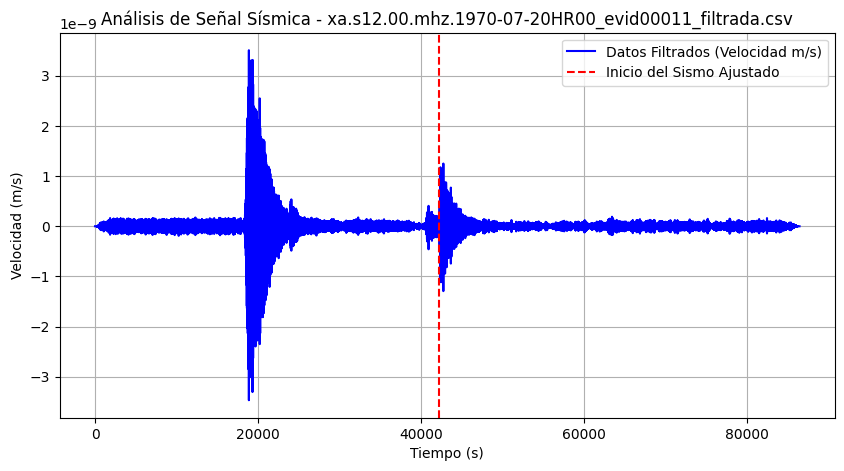

Tiempo ajustado leído: 71820
Rango de tiempo: 0.0 a 86403.32075471699
Línea de inicio del sismo graficada.


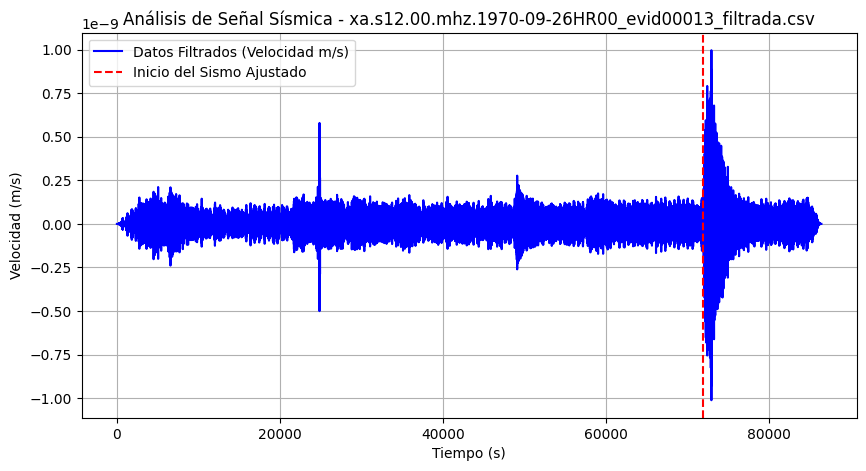

Tiempo ajustado leído: 41460
Rango de tiempo: 0.0 a 86402.8679245283
Línea de inicio del sismo graficada.


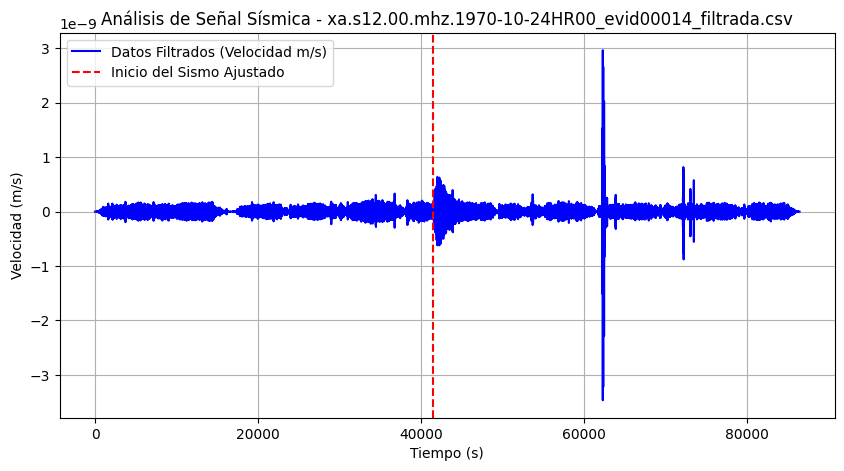

Tiempo ajustado leído: 46200
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


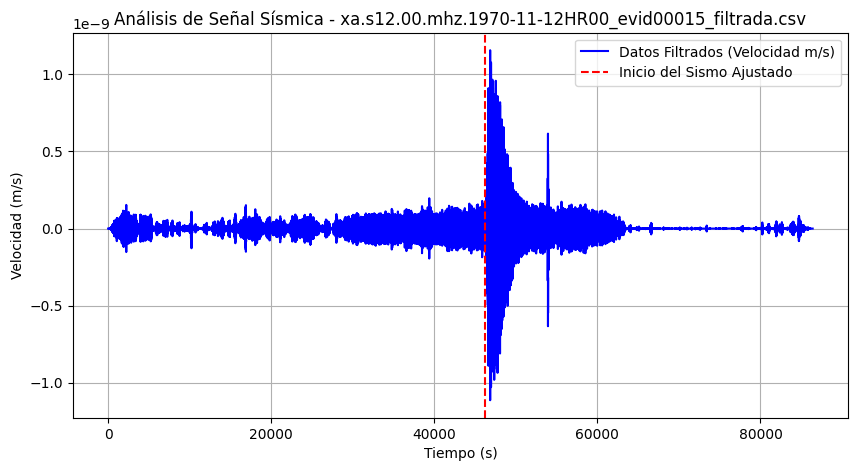

Tiempo ajustado leído: 26520
Rango de tiempo: 0.0 a 86402.11320754717
Línea de inicio del sismo graficada.


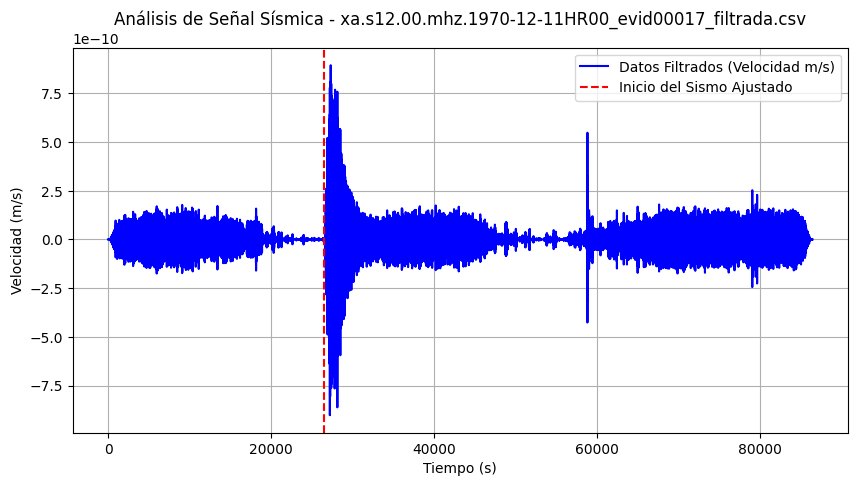

Tiempo ajustado leído: 74040
Rango de tiempo: 0.0 a 86403.32075471699
Línea de inicio del sismo graficada.


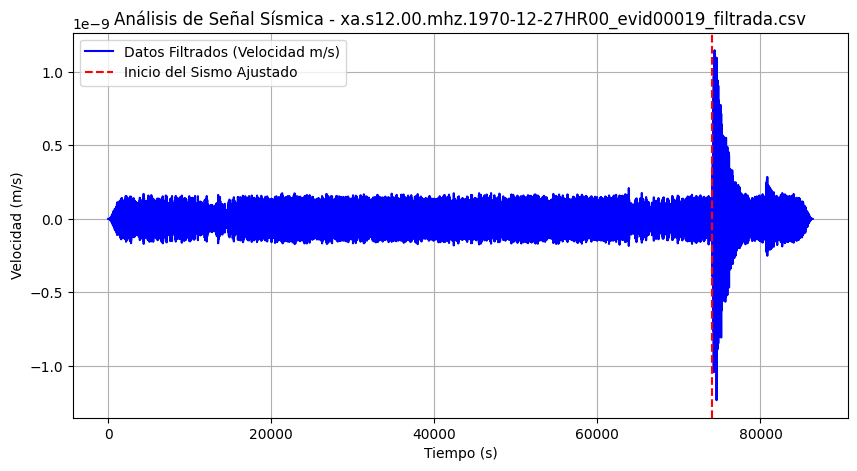

Tiempo ajustado leído: 56460
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


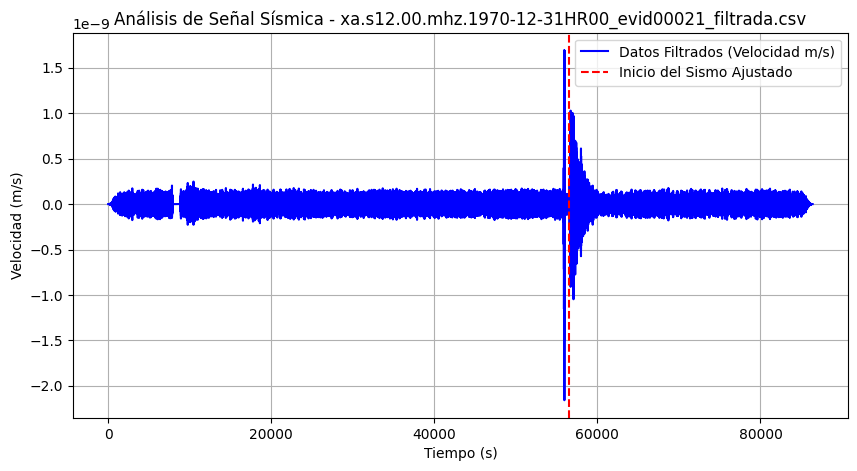

Tiempo ajustado leído: 45600
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


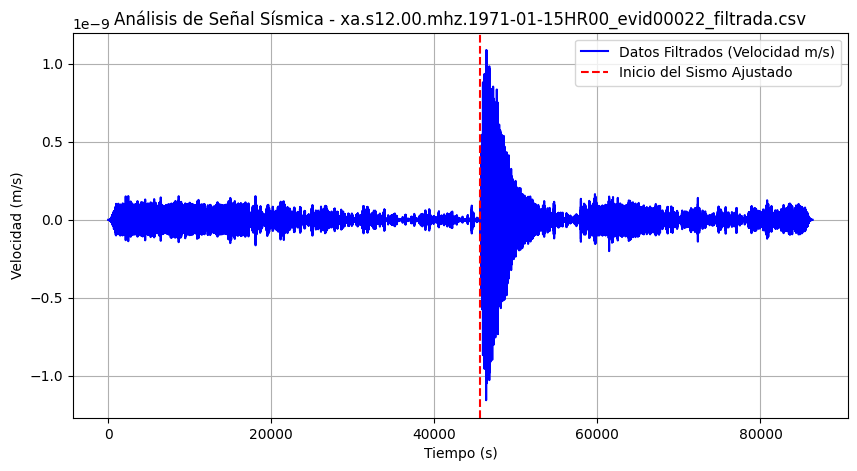

Tiempo ajustado leído: 53940
Rango de tiempo: 0.0 a 86403.32075471699
Línea de inicio del sismo graficada.


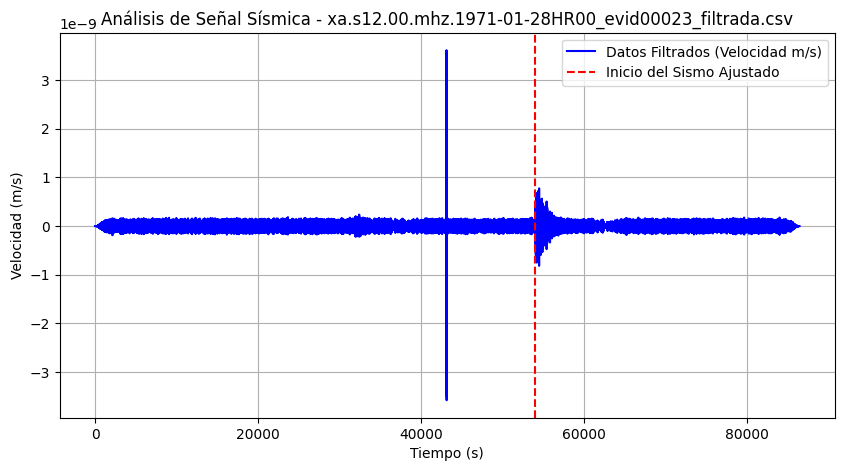

Tiempo ajustado leído: 66060
Rango de tiempo: 0.0 a 86403.32075471699
Línea de inicio del sismo graficada.


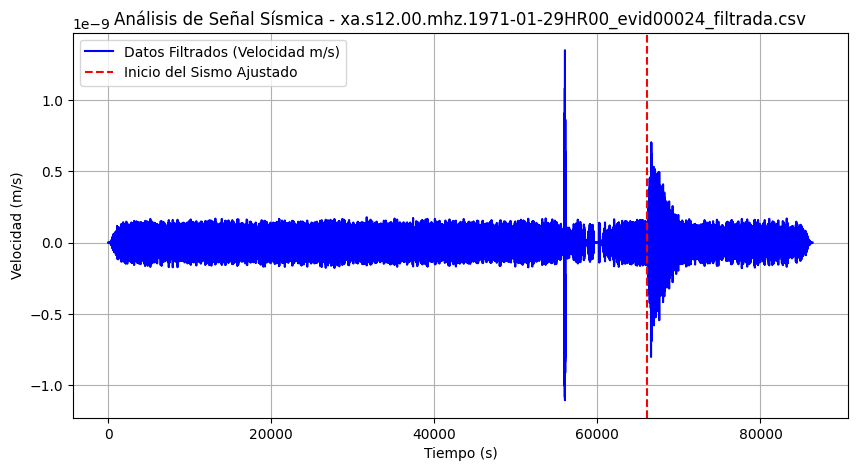

Tiempo ajustado leído: 13320
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


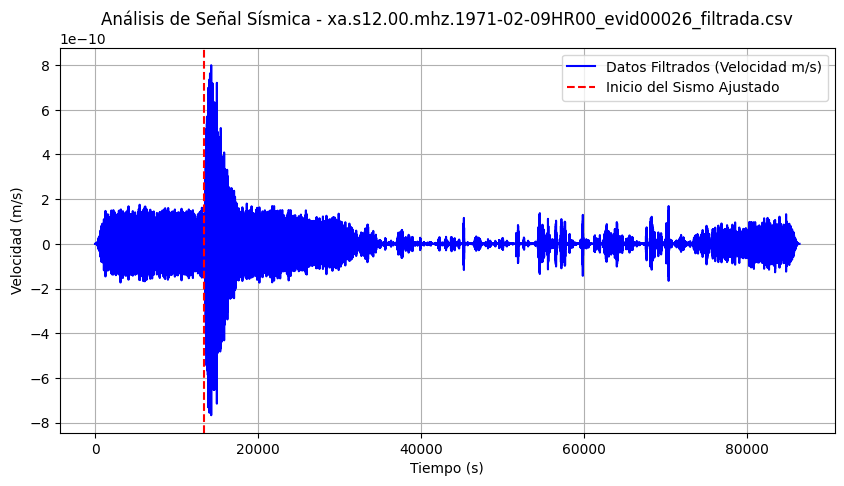

Tiempo ajustado leído: 55080
Rango de tiempo: 0.0 a 86403.92452830188
Línea de inicio del sismo graficada.


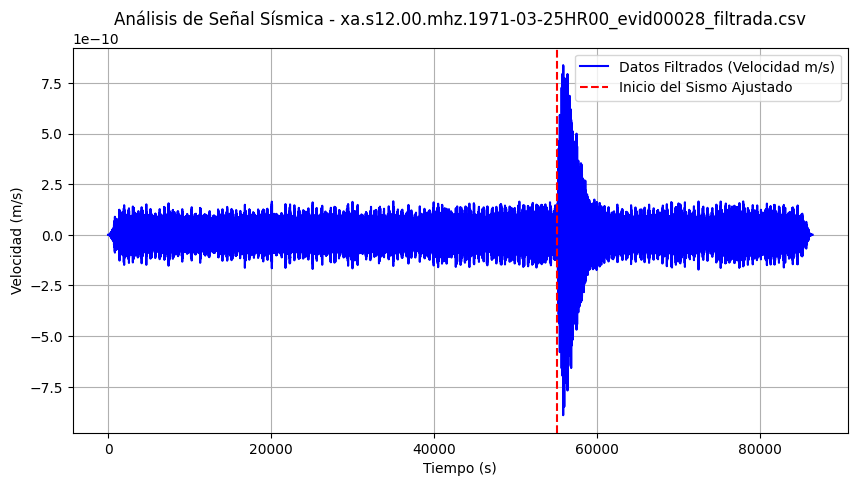

Tiempo ajustado leído: 25440
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


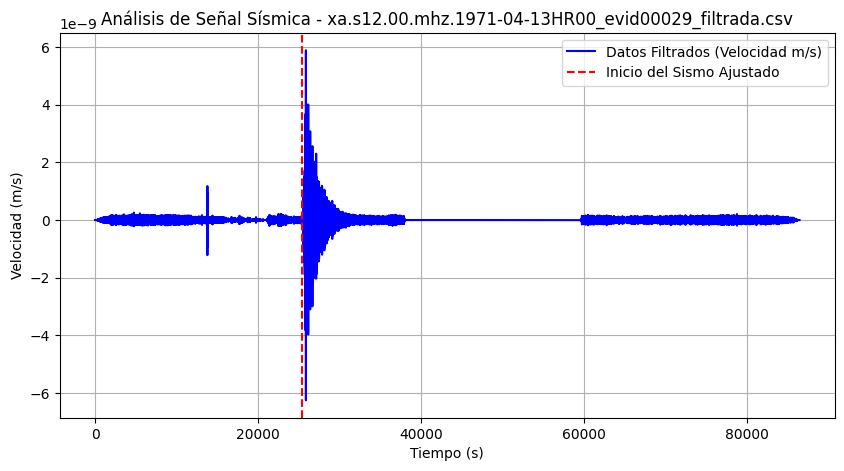

Tiempo ajustado leído: 29100
Rango de tiempo: 0.0 a 86400.90566037736
Línea de inicio del sismo graficada.


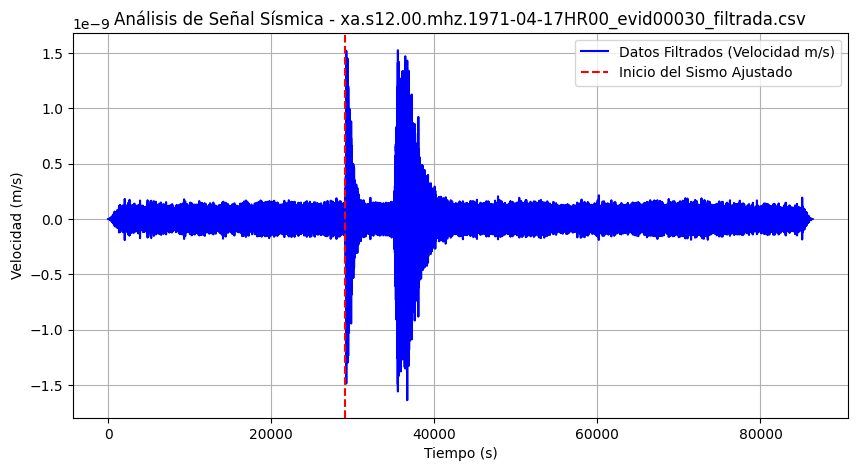

Tiempo ajustado leído: 35100
Rango de tiempo: 0.0 a 86400.90566037736
Línea de inicio del sismo graficada.


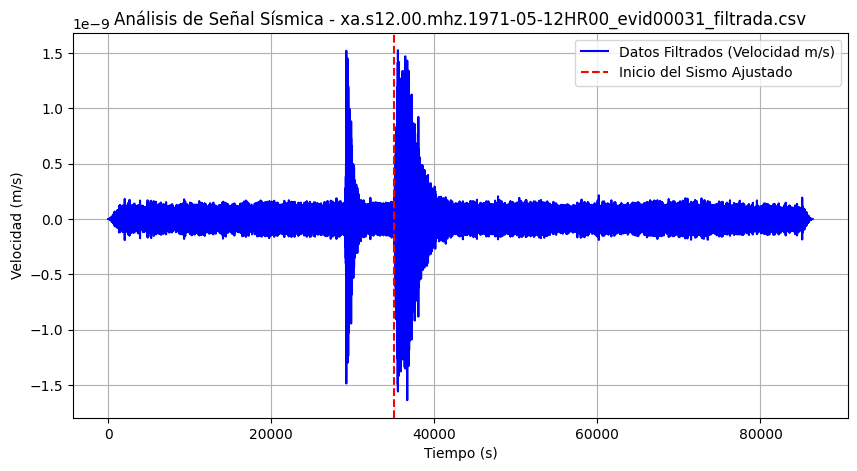

Tiempo ajustado leído: 10800
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


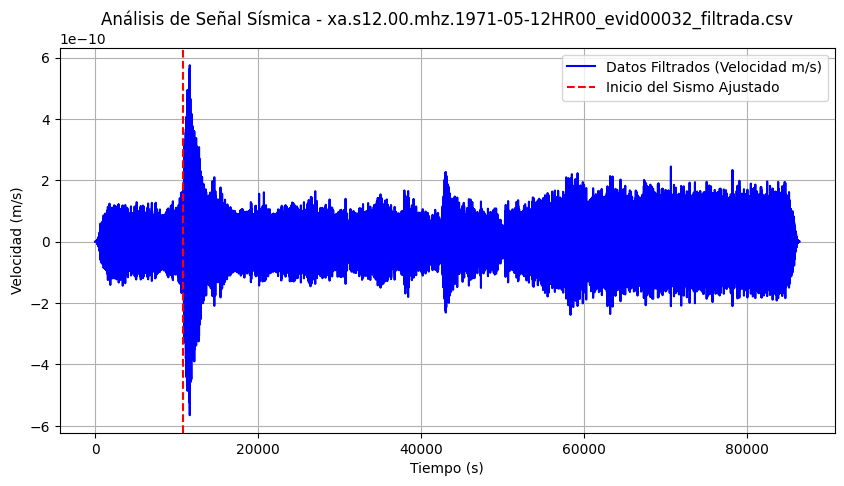

Tiempo ajustado leído: 80400
Rango de tiempo: 0.0 a 86403.32075471699
Línea de inicio del sismo graficada.


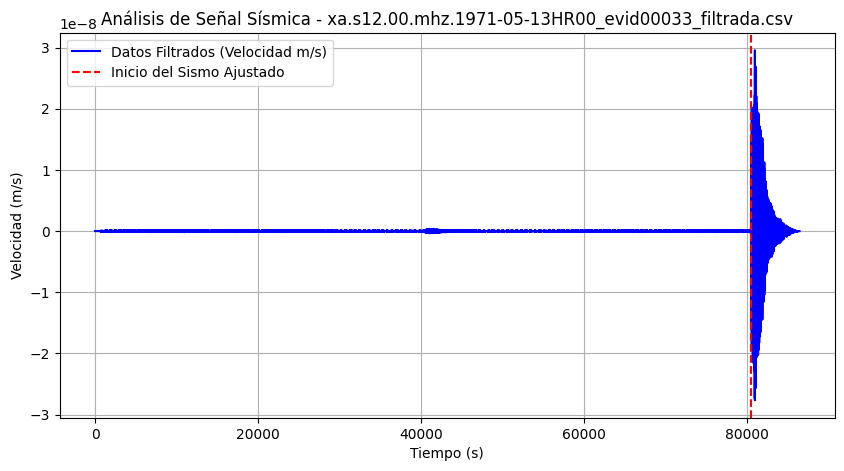

Tiempo ajustado leído: 39060
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


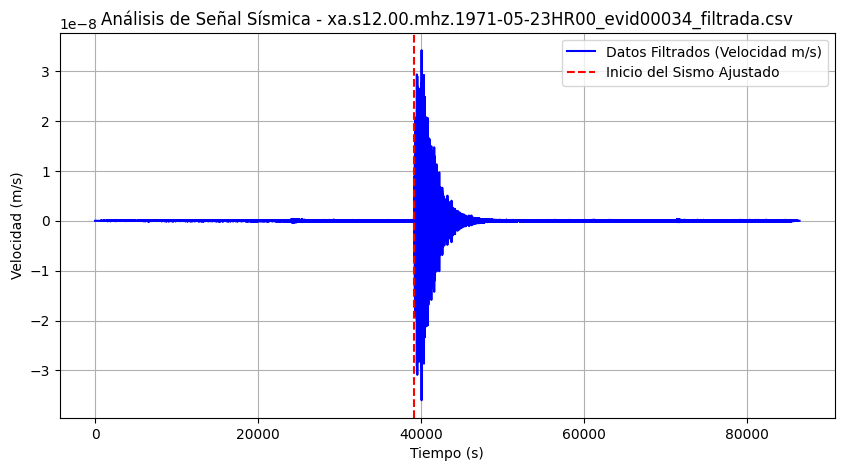

Tiempo ajustado leído: 32220
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


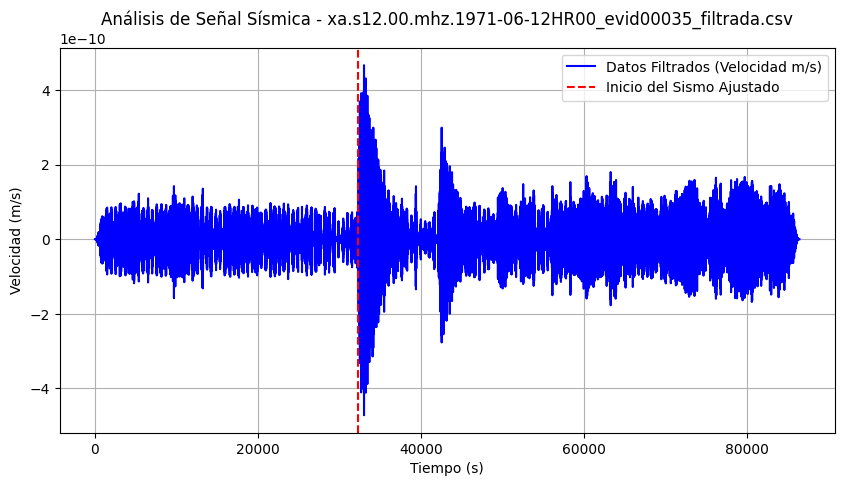

Tiempo ajustado leído: 11940
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


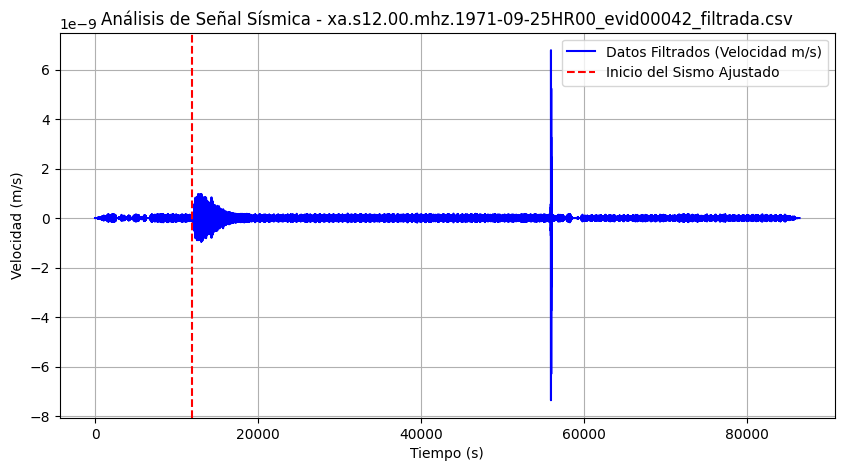

Tiempo ajustado leído: 65280
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


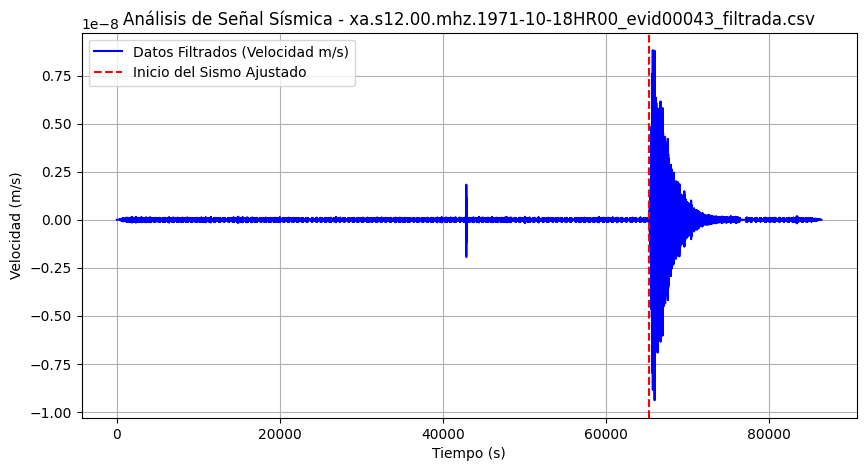

Tiempo ajustado leído: 19800
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


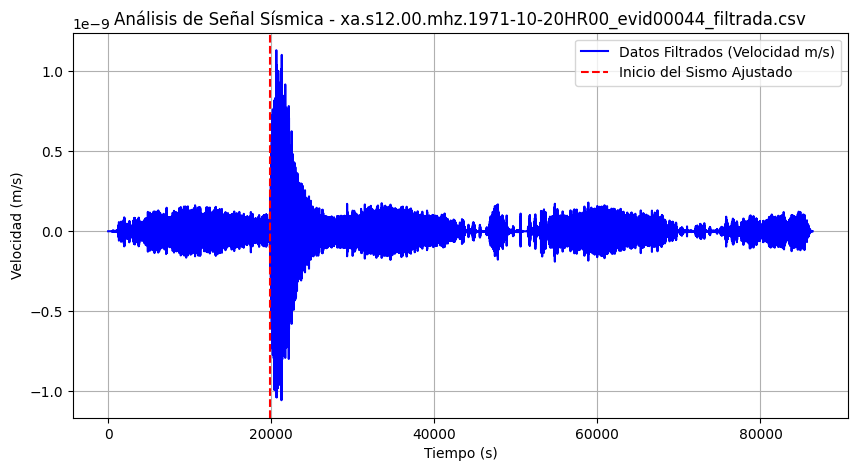

Tiempo ajustado leído: 15420
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


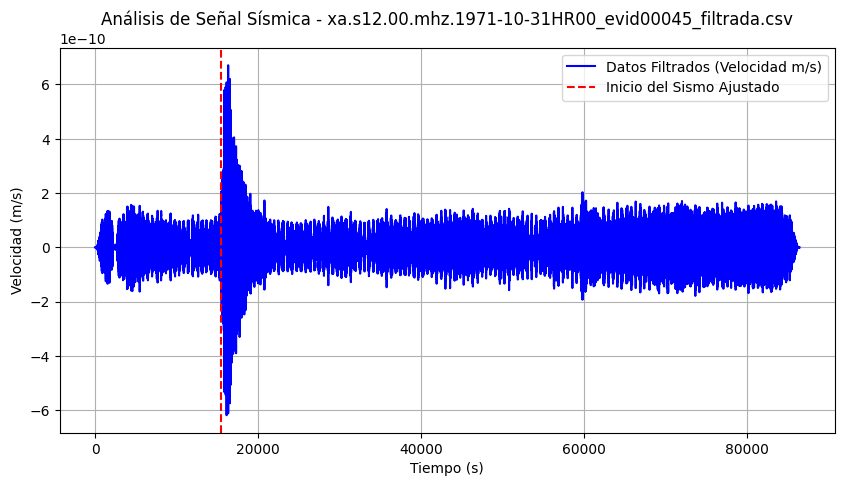

Tiempo ajustado leído: 23700
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


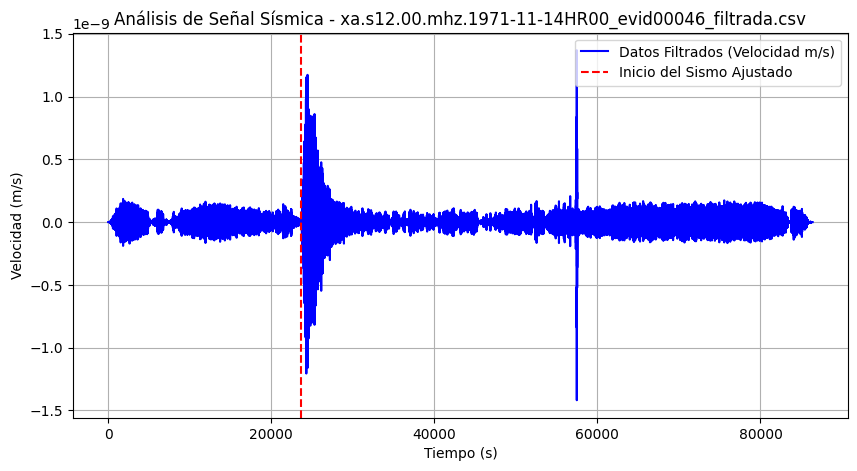

Tiempo ajustado leído: 64800
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


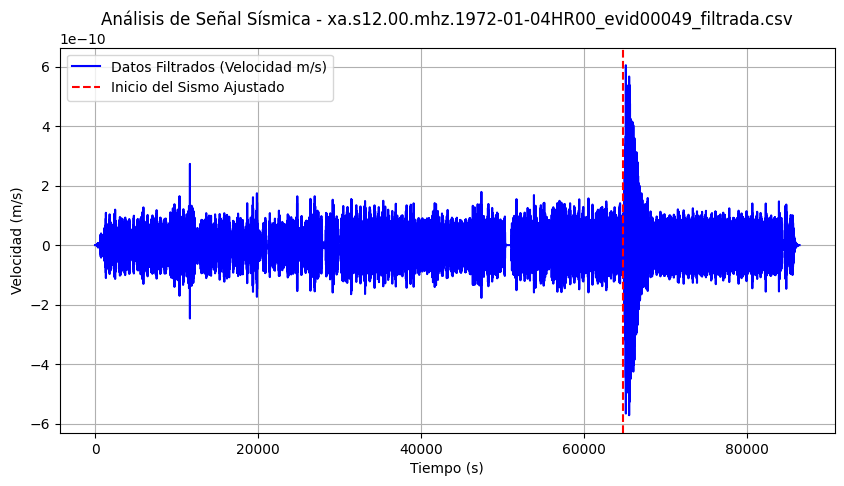

Tiempo ajustado leído: 48900
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


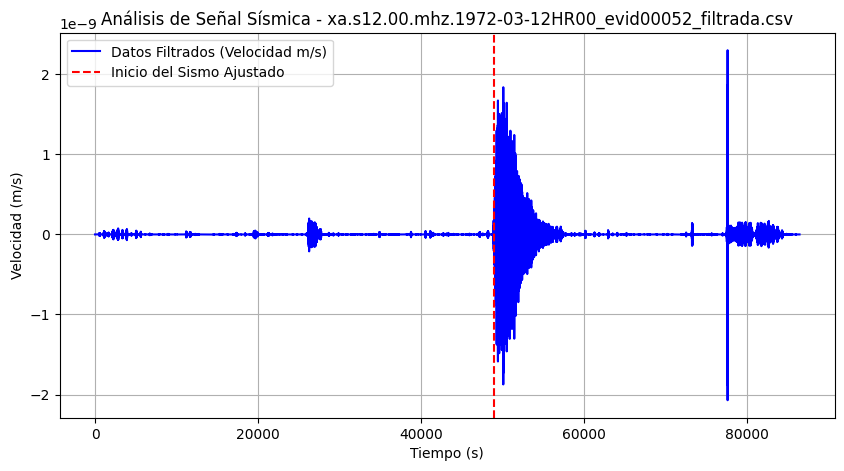

Tiempo ajustado leído: 58260
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


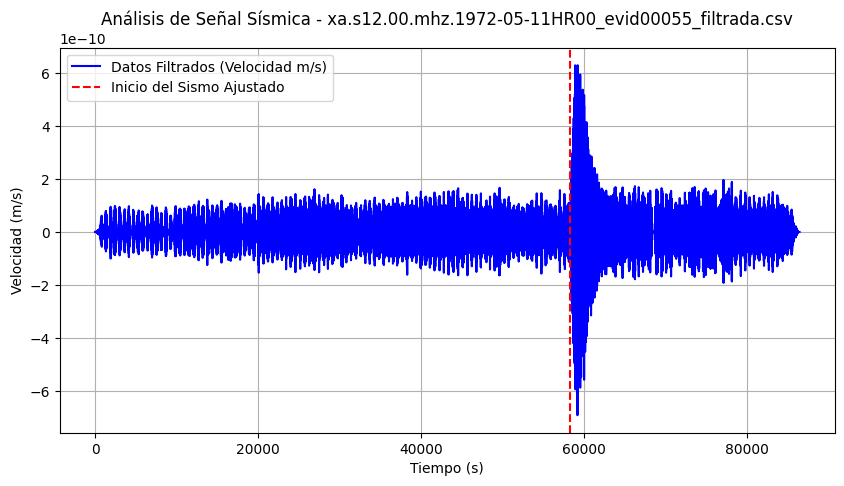

Tiempo ajustado leído: 28200
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


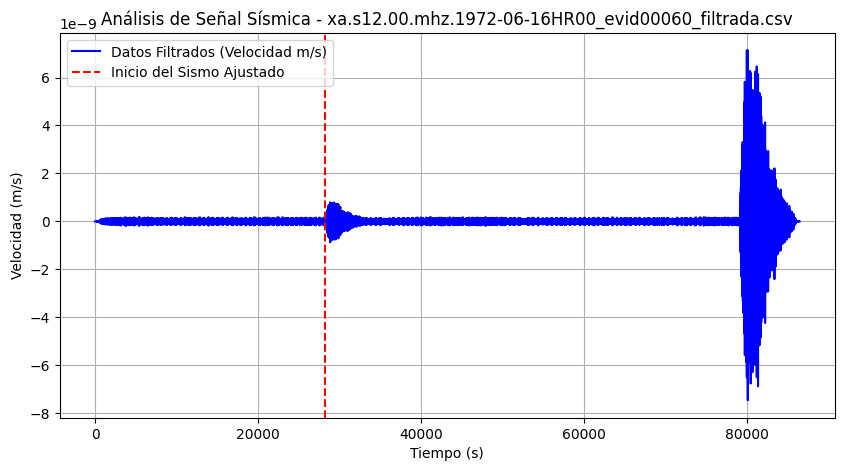

Tiempo ajustado leído: 78960
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


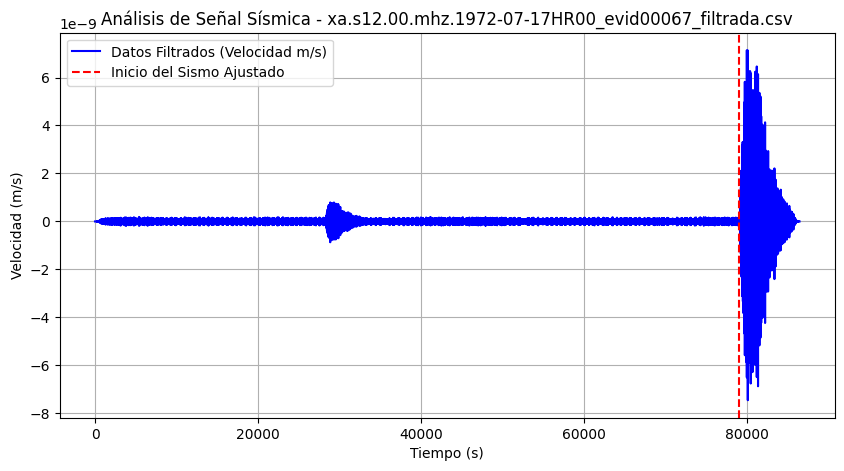

Tiempo ajustado leído: 8580
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


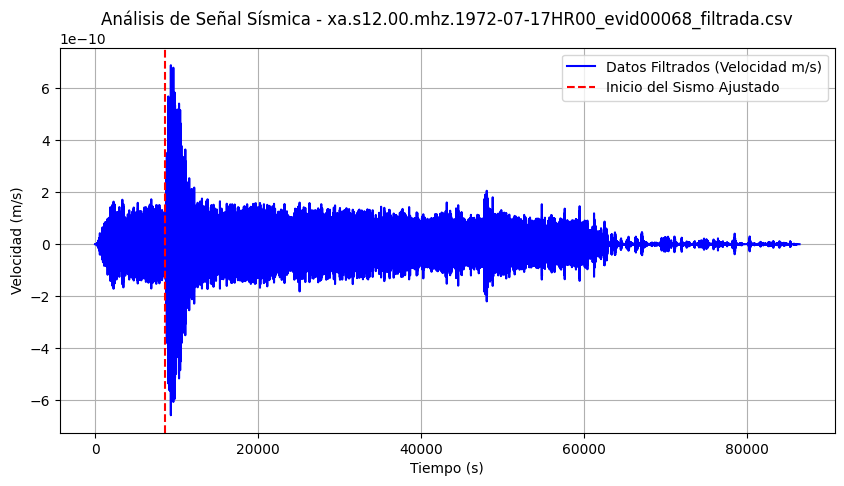

Tiempo ajustado leído: 65280
Rango de tiempo: 0.0 a 86402.11320754717
Línea de inicio del sismo graficada.


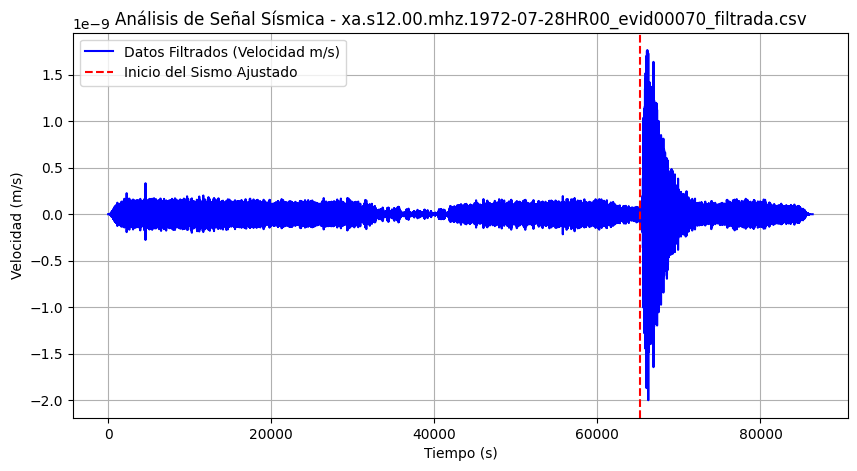

Tiempo ajustado leído: 28680
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


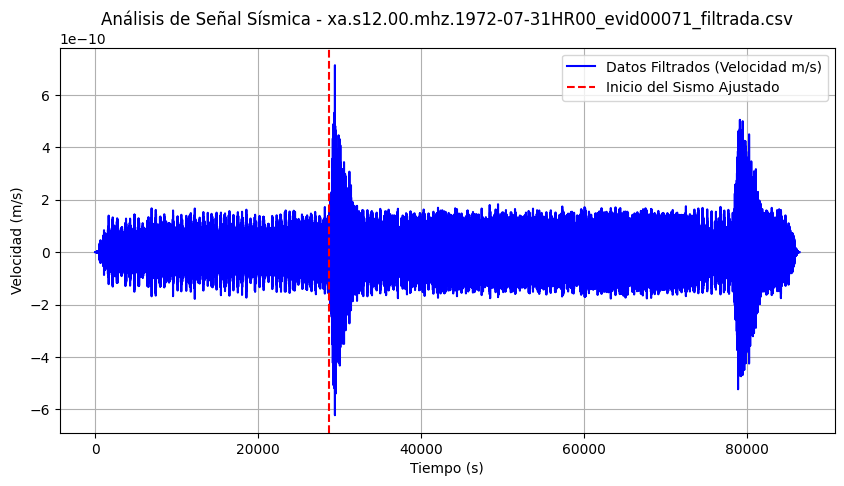

Tiempo ajustado leído: 9480
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


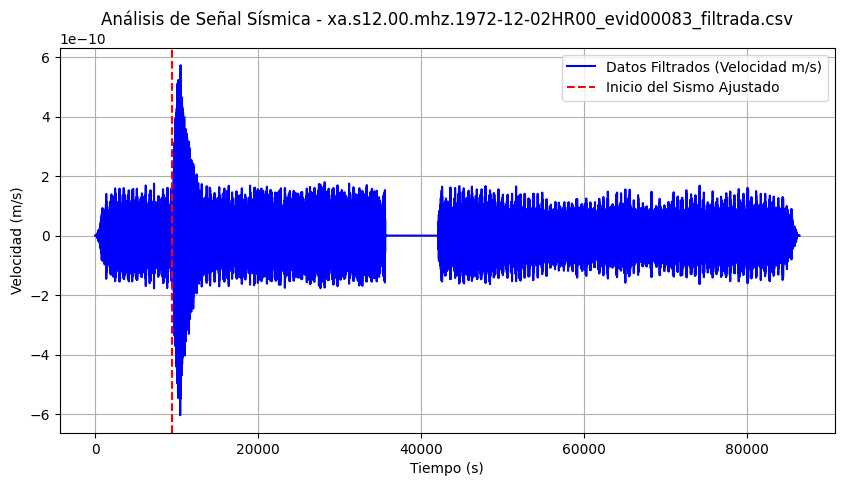

Tiempo ajustado leído: 82860
Rango de tiempo: 0.0 a 86402.11320754717
Línea de inicio del sismo graficada.


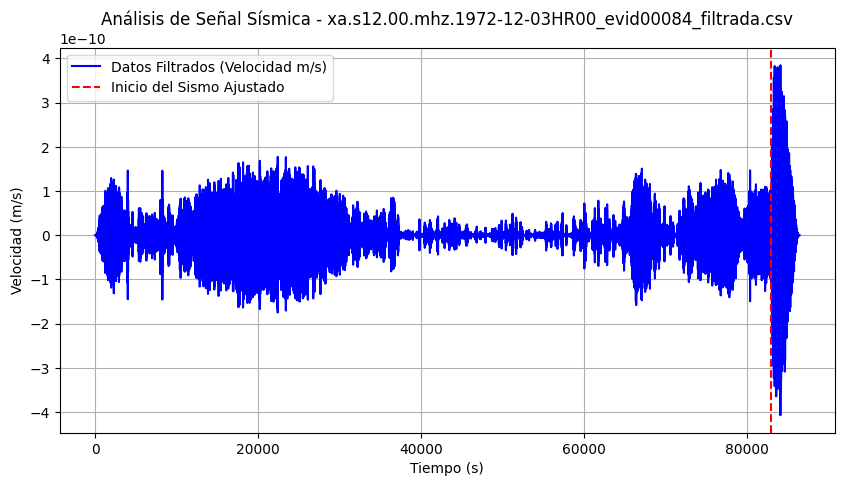

Tiempo ajustado leído: 2640
Rango de tiempo: 0.0 a 86399.09433962264
Línea de inicio del sismo graficada.


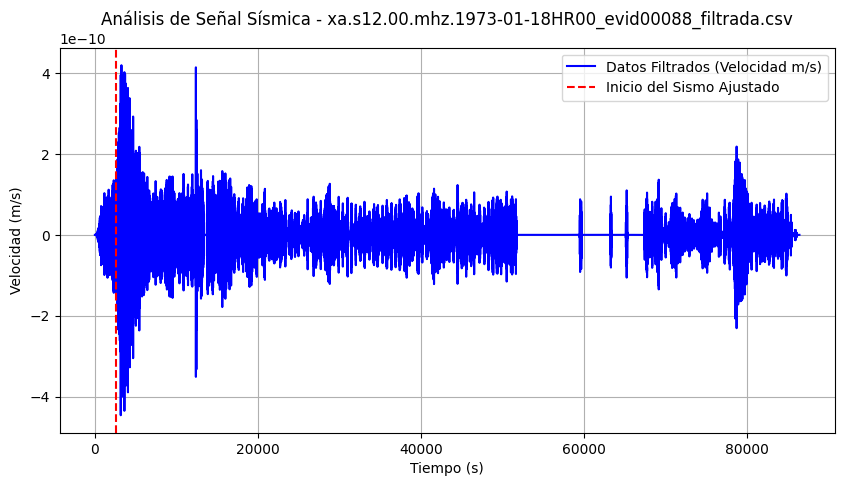

Tiempo ajustado leído: 26100
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


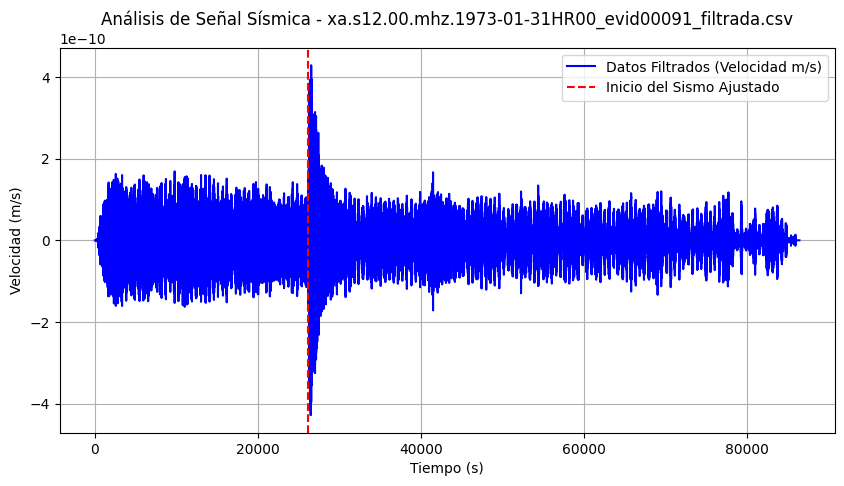

Tiempo ajustado leído: 28860
Rango de tiempo: 0.0 a 51679.54716981132
Línea de inicio del sismo graficada.


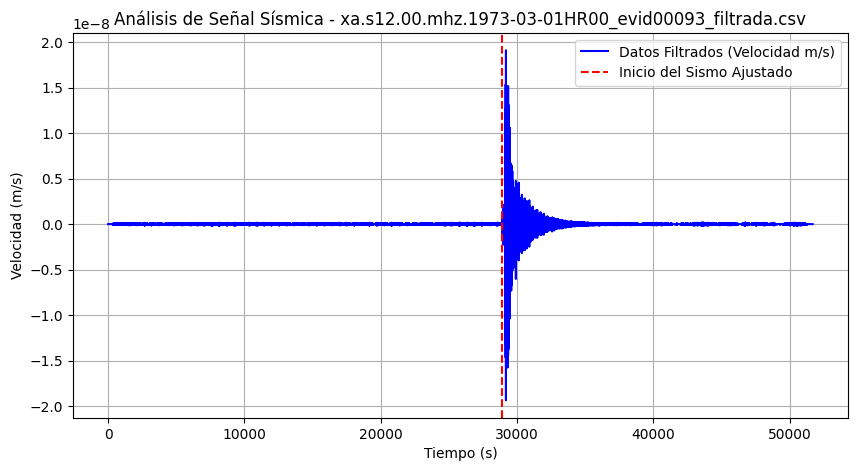

Tiempo ajustado leído: 69780
Rango de tiempo: 0.0 a 86379.16981132075
Línea de inicio del sismo graficada.


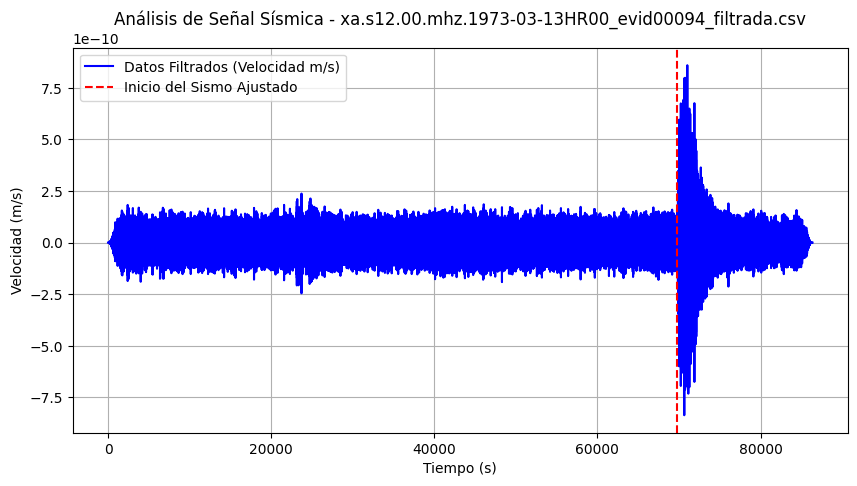

Tiempo ajustado leído: 2640
Rango de tiempo: 0.0 a 86402.11320754717
Línea de inicio del sismo graficada.


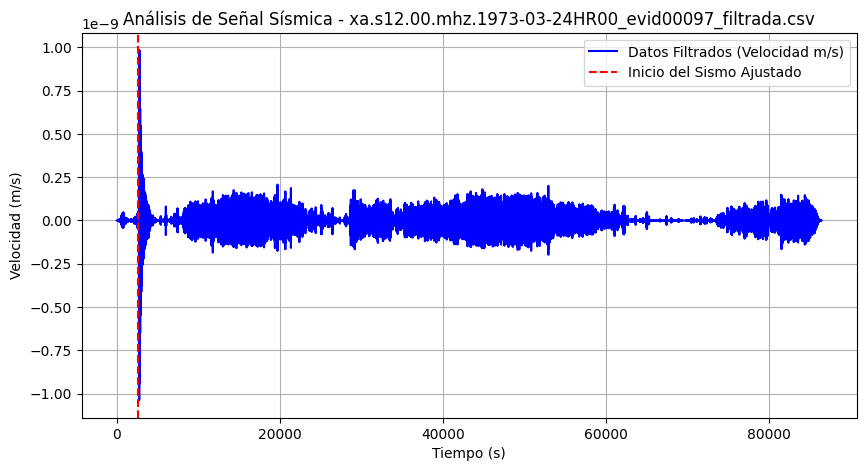

Tiempo ajustado leído: 9480
Rango de tiempo: 0.0 a 86399.09433962264
Línea de inicio del sismo graficada.


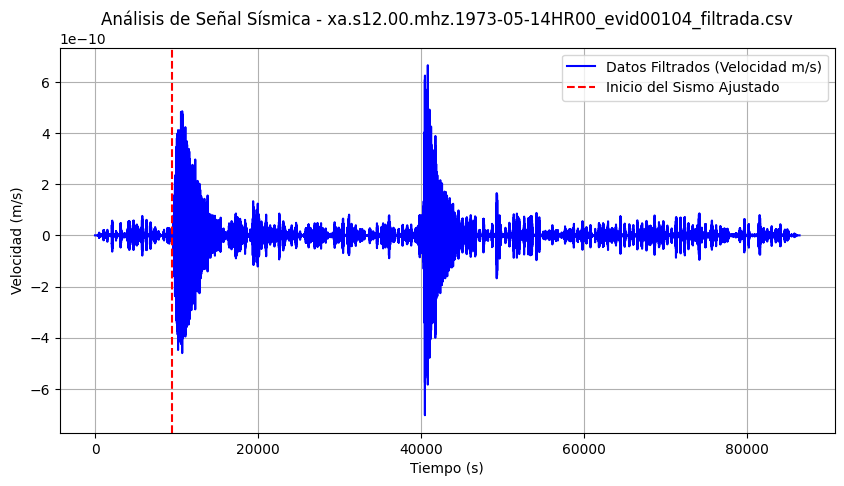

Tiempo ajustado leído: 40200
Rango de tiempo: 0.0 a 86399.09433962264
Línea de inicio del sismo graficada.


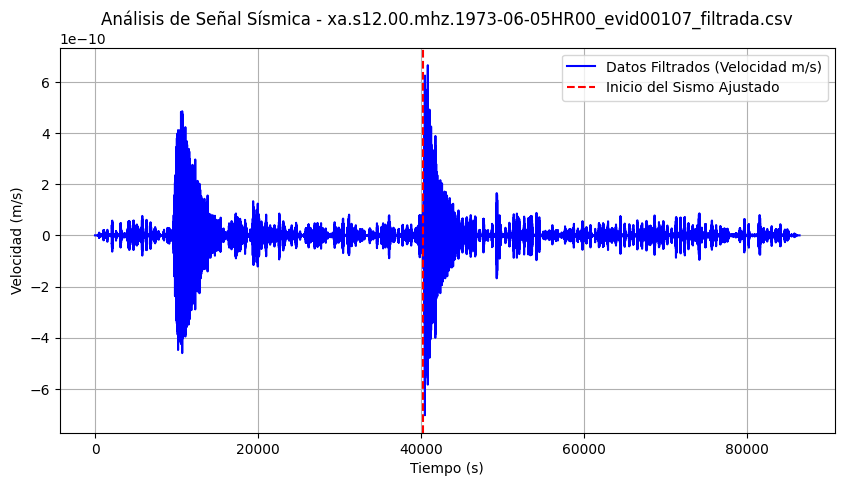

Tiempo ajustado leído: 6120
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


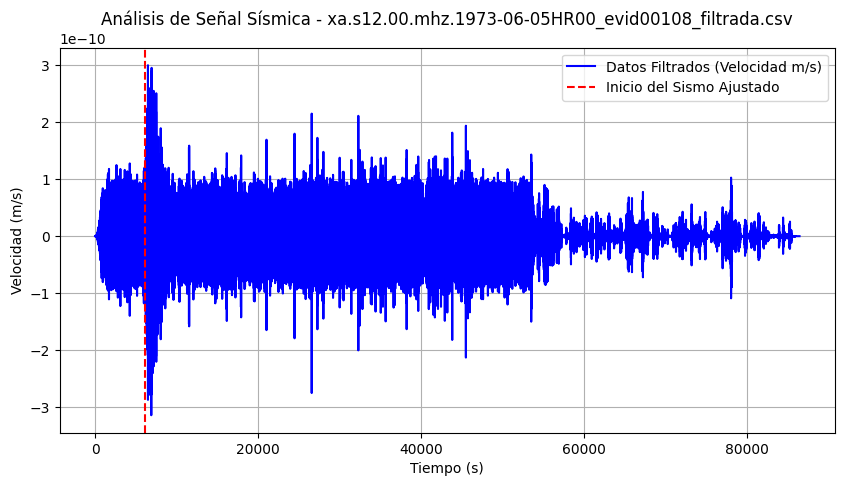

Tiempo ajustado leído: 66960
Rango de tiempo: 0.0 a 86399.69811320755
Línea de inicio del sismo graficada.


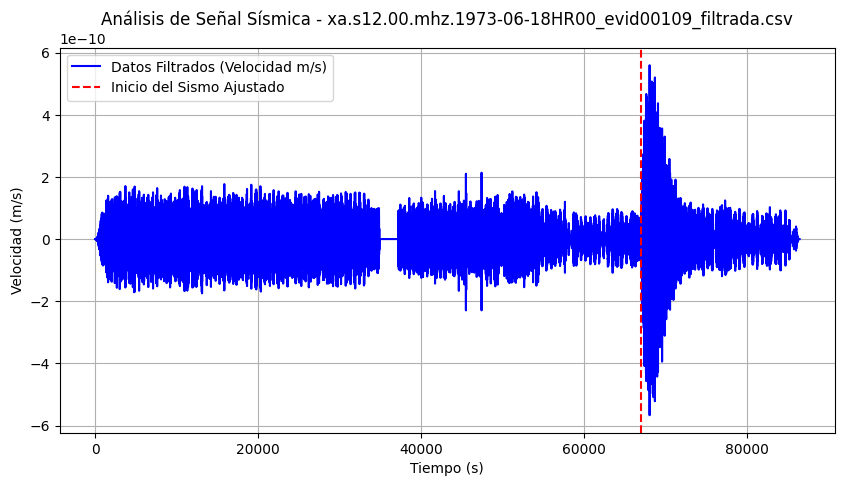

Tiempo ajustado leído: 65700
Rango de tiempo: 0.0 a 86399.09433962264
Línea de inicio del sismo graficada.


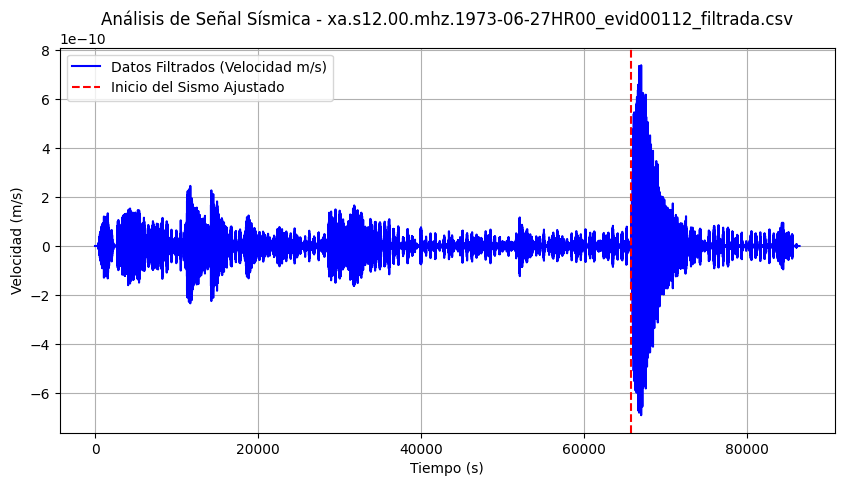

Tiempo ajustado leído: 9960
Rango de tiempo: 0.0 a 86399.09433962264
Línea de inicio del sismo graficada.


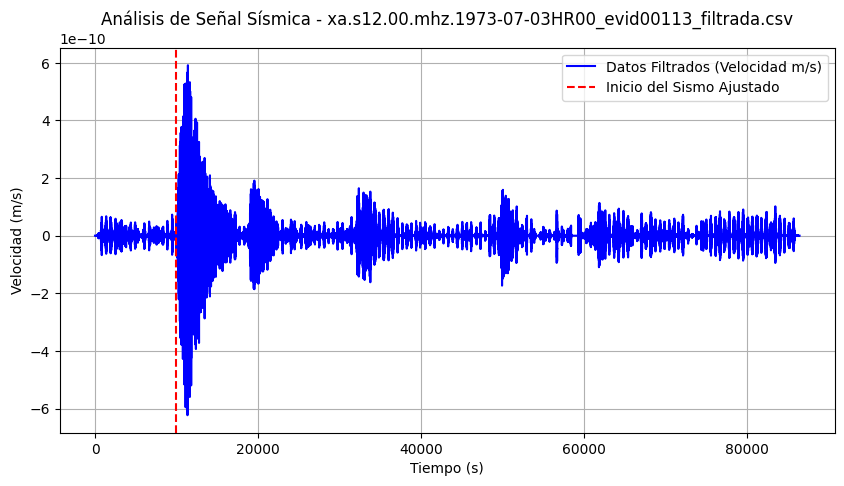

Tiempo ajustado leído: 68520
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


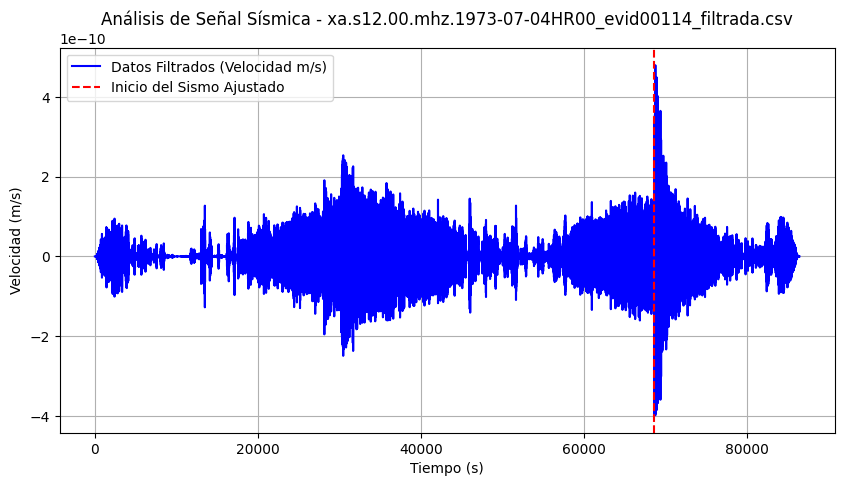

Tiempo ajustado leído: 3120
Rango de tiempo: 0.0 a 86399.09433962264
Línea de inicio del sismo graficada.


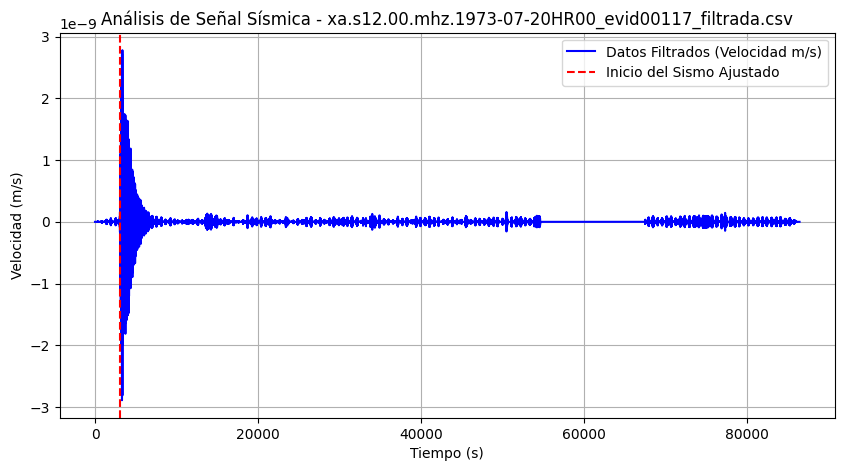

Tiempo ajustado leído: 84660
Rango de tiempo: 0.0 a 86399.09433962264
Línea de inicio del sismo graficada.


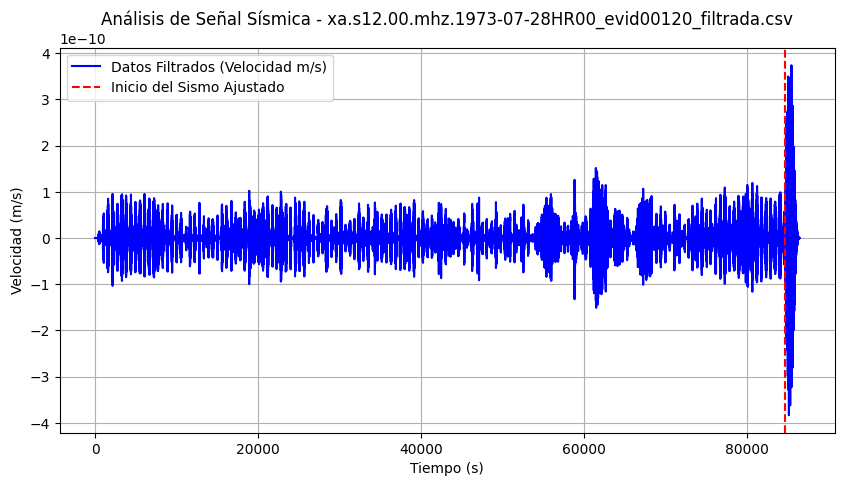

Tiempo ajustado leído: 44220
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


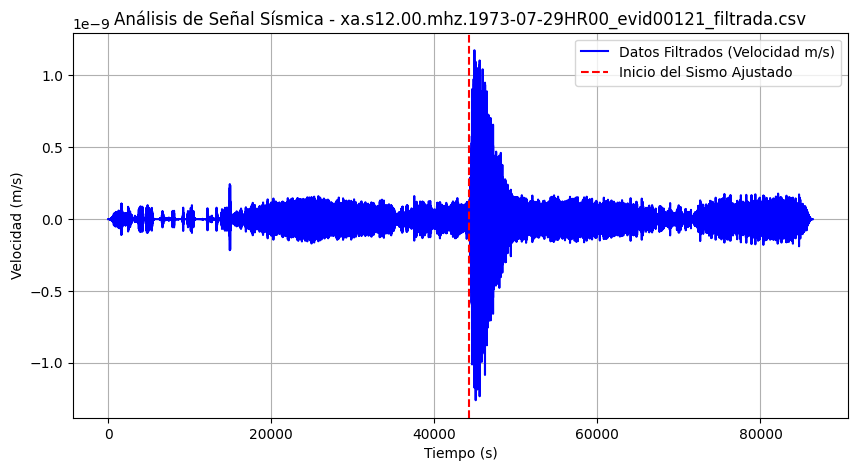

Tiempo ajustado leído: 84060
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


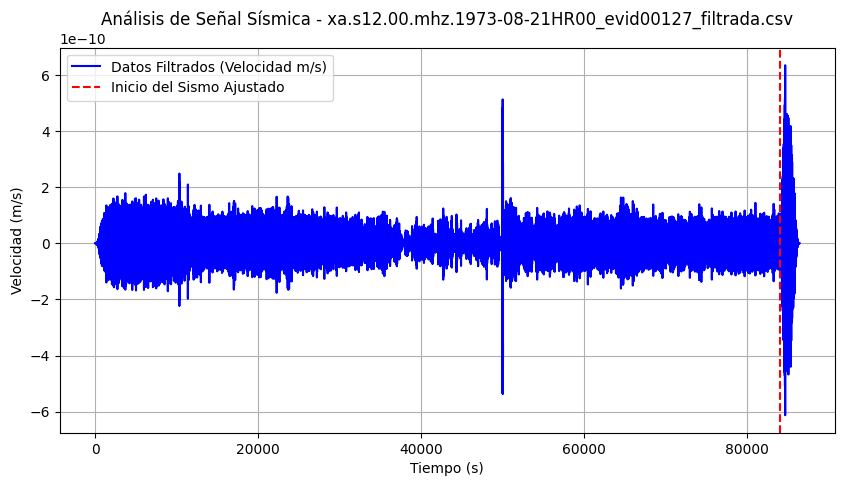

Tiempo ajustado leído: 22860
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


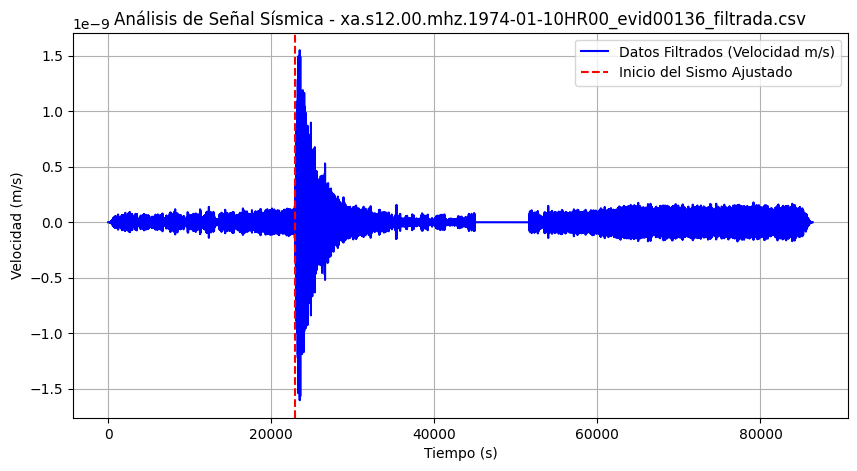

Tiempo ajustado leído: 81000
Rango de tiempo: 0.0 a 86402.11320754717
Línea de inicio del sismo graficada.


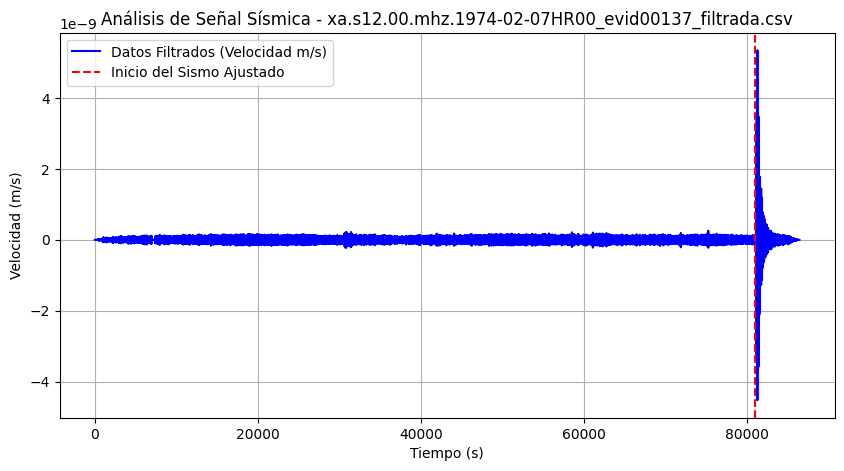

Tiempo ajustado leído: 61080
Rango de tiempo: 0.0 a 86398.3396226415
Línea de inicio del sismo graficada.


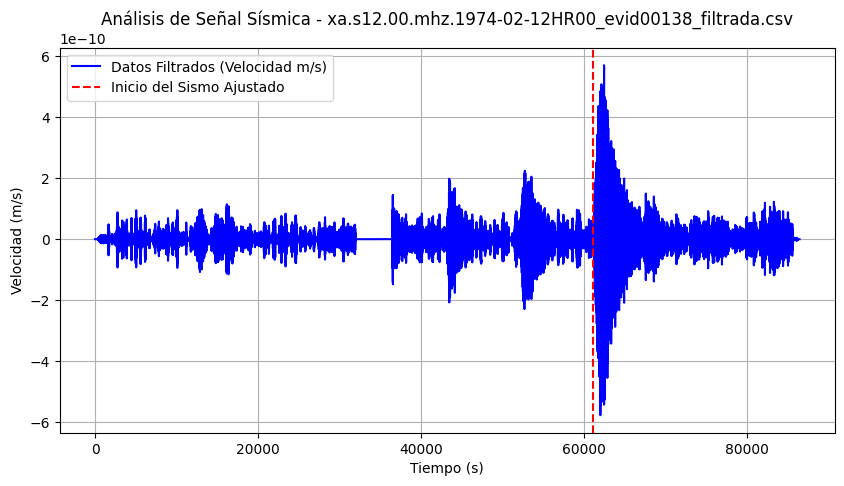

Tiempo ajustado leído: 31200
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


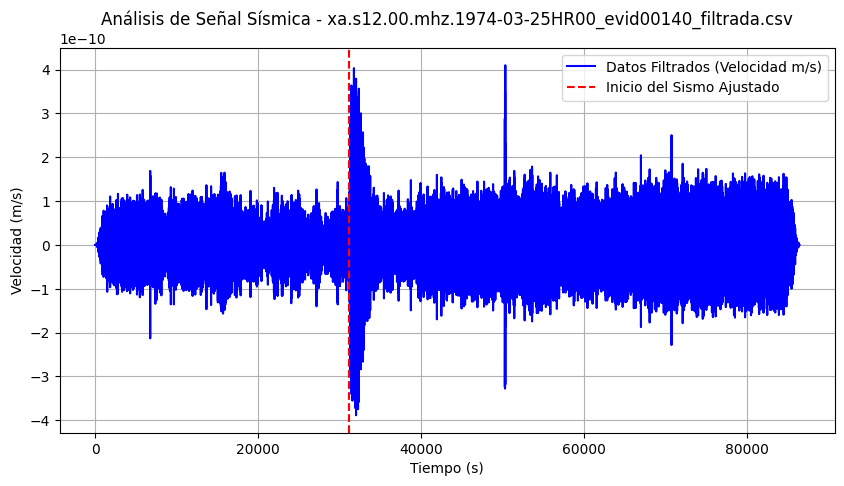

Tiempo ajustado leído: 66840
Rango de tiempo: 0.0 a 86397.7358490566
Línea de inicio del sismo graficada.


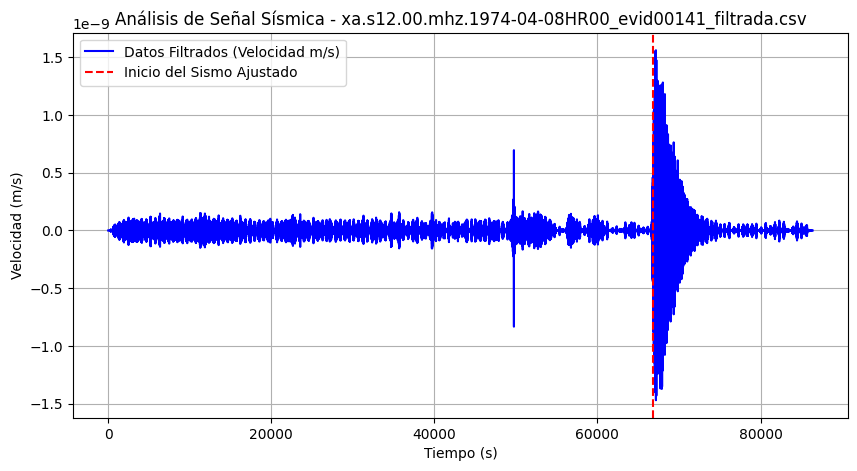

Tiempo ajustado leído: 33480
Rango de tiempo: 0.0 a 86397.7358490566
Línea de inicio del sismo graficada.


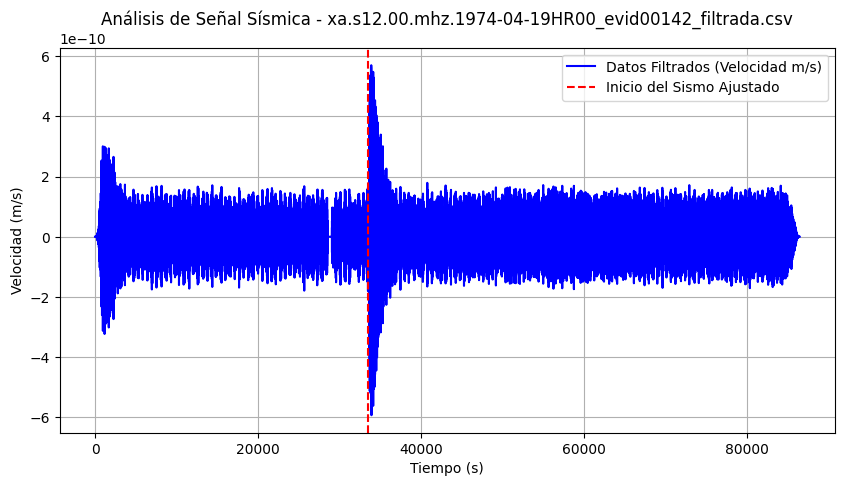

Tiempo ajustado leído: 51480
Rango de tiempo: 0.0 a 86397.28301886792
Línea de inicio del sismo graficada.


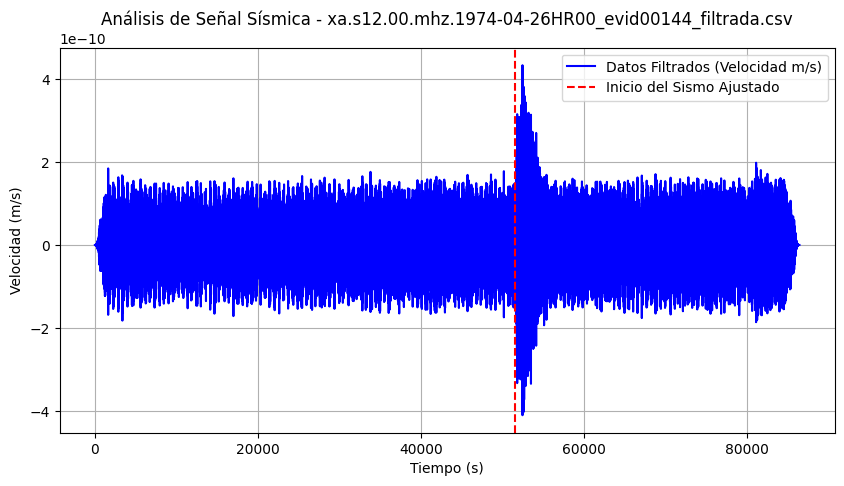

Tiempo ajustado leído: 1380
Rango de tiempo: 0.0 a 86403.32075471699
Línea de inicio del sismo graficada.


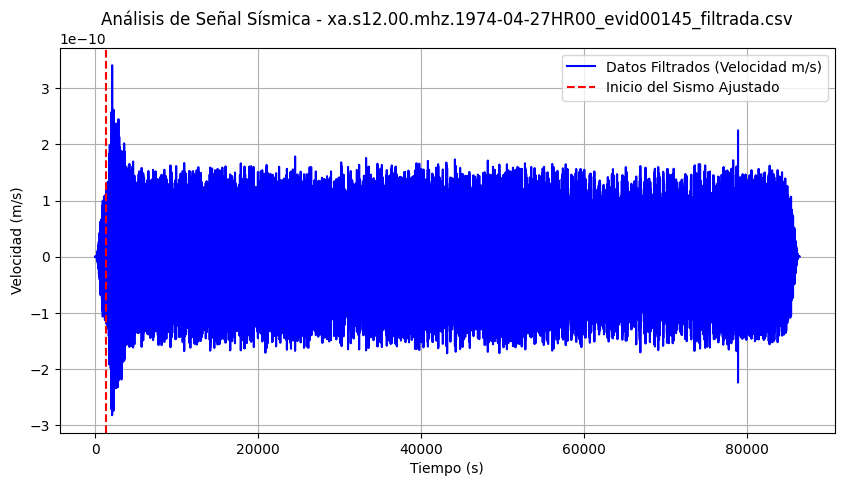

Tiempo ajustado leído: 10620
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


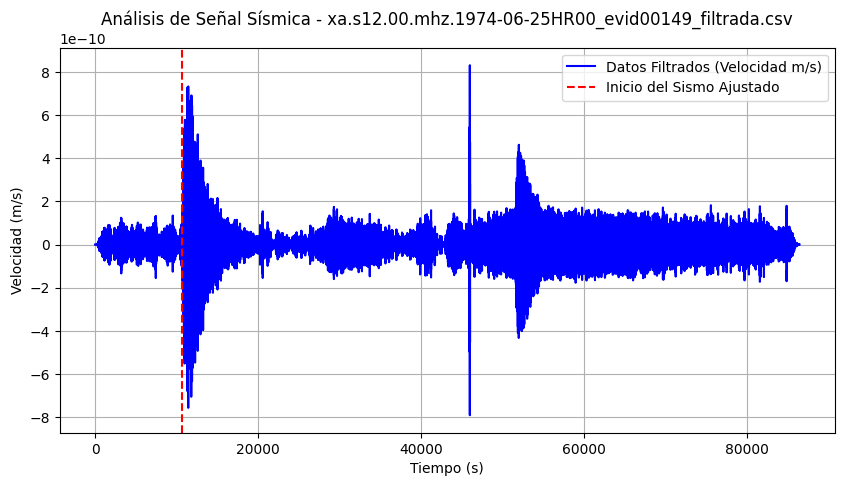

Tiempo ajustado leído: 51240
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


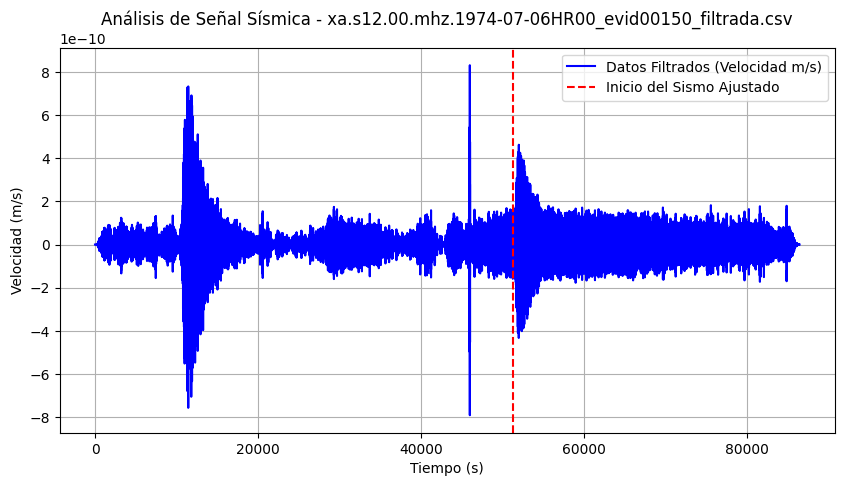

Tiempo ajustado leído: 3120
Rango de tiempo: 0.0 a 86402.11320754717
Línea de inicio del sismo graficada.


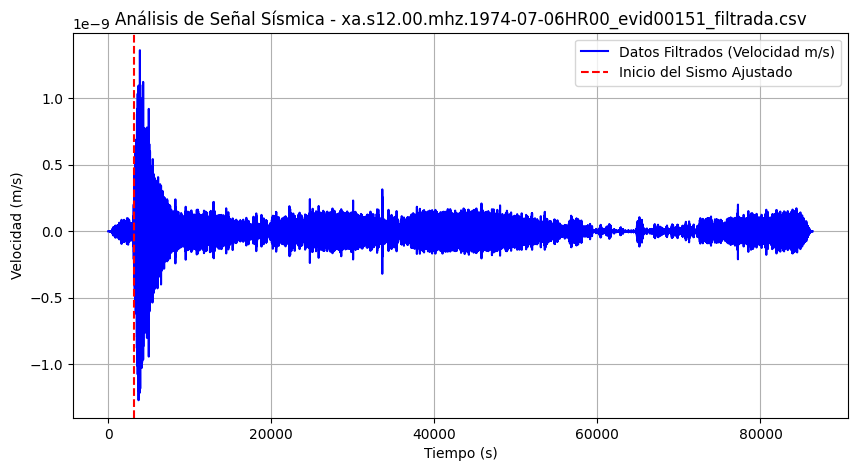

Tiempo ajustado leído: 43500
Rango de tiempo: 0.0 a 86403.32075471699
Línea de inicio del sismo graficada.


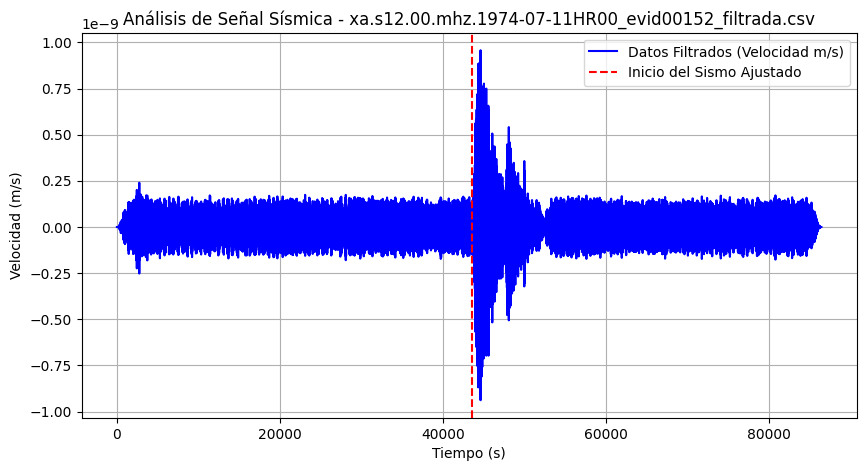

Tiempo ajustado leído: 63780
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


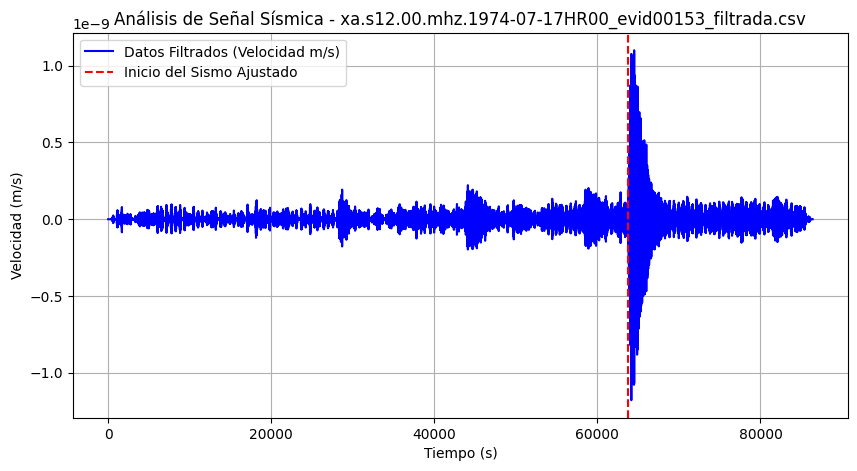

Tiempo ajustado leído: 65700
Rango de tiempo: 0.0 a 86403.32075471699
Línea de inicio del sismo graficada.


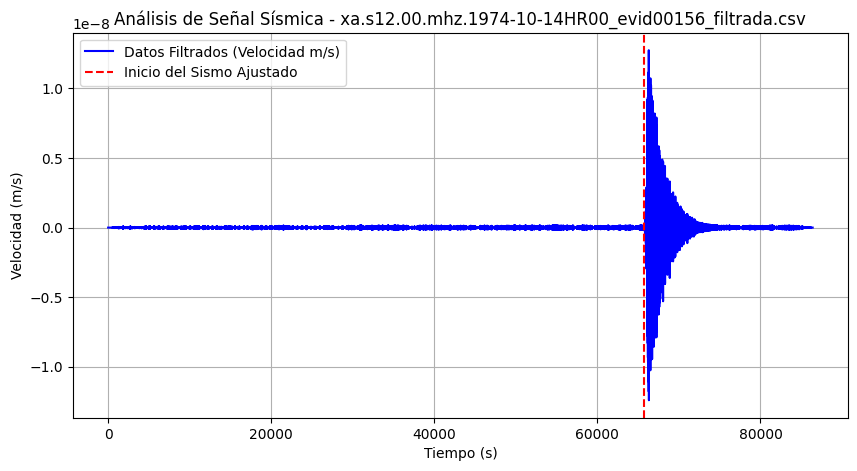

Tiempo ajustado leído: 36300
Rango de tiempo: 0.0 a 86402.56603773584
Línea de inicio del sismo graficada.


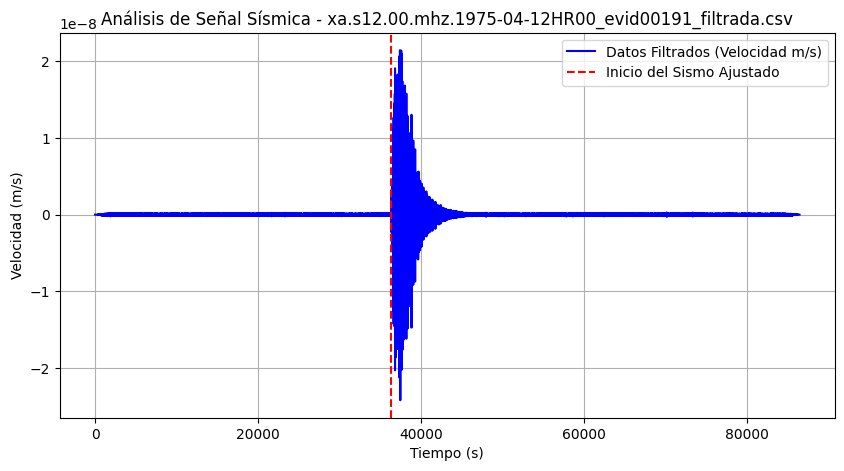

Tiempo ajustado leído: 57780
Rango de tiempo: 0.0 a 86401.50943396226
Línea de inicio del sismo graficada.


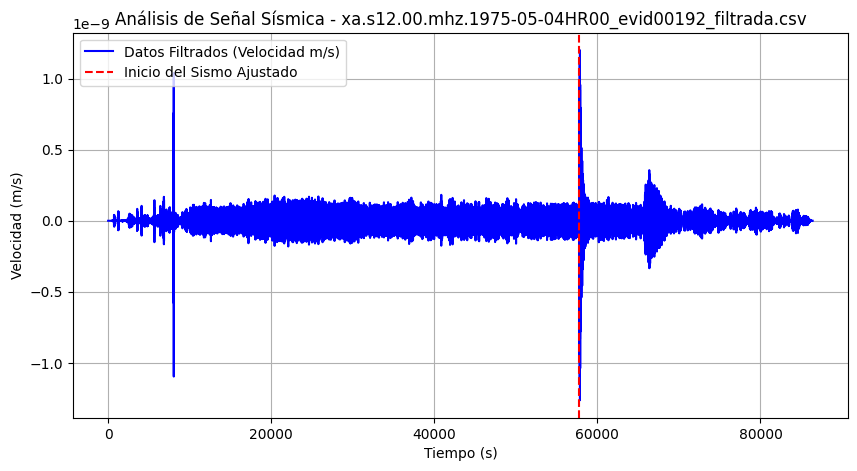

Tiempo ajustado leído: 12240
Rango de tiempo: 0.0 a 86400.90566037736
Línea de inicio del sismo graficada.


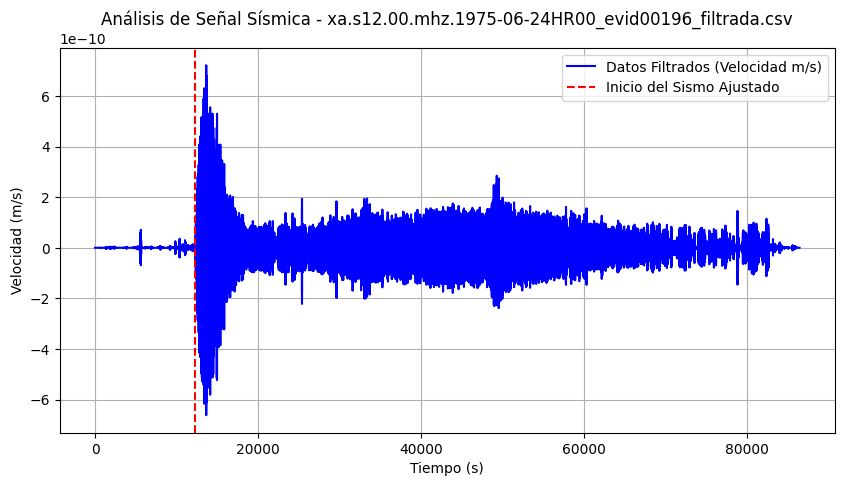

Gráficas generadas y datos almacenados.


In [5]:

import numpy as np
import matplotlib.pyplot as plt
import os

# Crear una lista de archivos filtrados y ajustados
filtered_folder = 'data_filtrada1'
adjusted_arrivals_folder = 'tiempos_inicio_sismos_ajustados'

# Obtener la lista de archivos filtrados
filtered_files = [f for f in os.listdir(filtered_folder) if f.endswith('_filtrada.csv')]
adjusted_arrival_files = [f for f in os.listdir(adjusted_arrivals_folder) if f.endswith('_inicio_ajustado.csv')]

# Inicializar listas para almacenar valores de velocidad y tiempos ajustados
velocities = []
adjusted_times = []

# Graficar los datos
for filtered_file, arrival_file in zip(filtered_files, adjusted_arrival_files):
    # Cargar datos filtrados
    filtered_data = np.loadtxt(os.path.join(filtered_folder, filtered_file), delimiter=',', skiprows=1)
    time_abs = filtered_data[:, 0]
    velocity = filtered_data[:, 2]

    # Cargar tiempos ajustados
    adjusted_arrival_path = os.path.join(adjusted_arrivals_folder, arrival_file)
    
    if os.path.exists(adjusted_arrival_path):
        adjusted_arrival = np.loadtxt(adjusted_arrival_path, delimiter=',', skiprows=1)
        
        # Verificar que hay datos en adjusted_arrival
        if adjusted_arrival.size == 0:
            print(f"Advertencia: El archivo {arrival_file} está vacío.")
            continue
        
        # Asegurarse de que el tiempo ajustado esté en formato adecuado
        if np.ndim(adjusted_arrival) == 0:  # Si es un escalar
            adjusted_time = int(adjusted_arrival)  # Asignar directamente como entero
        else:
            adjusted_time = int(adjusted_arrival[0])  # Para arreglos
        
        print(f"Tiempo ajustado leído: {adjusted_time}")
    else:
        print(f"Advertencia: El archivo {arrival_file} no se encontró.")
        continue

    # Graficar
    plt.figure(figsize=(10, 5))
    
    # Graficar la señal filtrada
    plt.plot(time_abs, velocity, label='Datos Filtrados (Velocidad m/s)', color='blue')

    # Agregar la línea de llegada del sismo ajustada
    # Verificar si el tiempo ajustado está dentro del rango de tiempo
    print(f"Rango de tiempo: {time_abs[0]} a {time_abs[-1]}")
    if adjusted_time >= time_abs[0] and adjusted_time <= time_abs[-1]:
        plt.axvline(x=adjusted_time, color='red', linestyle='--', label='Inicio del Sismo Ajustado')
        print("Línea de inicio del sismo graficada.")
    else:
        print(f"Advertencia: El tiempo ajustado {adjusted_time} está fuera del rango de la señal filtrada.")
    
    # Títulos y etiquetas
    plt.title(f'Análisis de Señal Sísmica - {filtered_file.strip()}')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Velocidad (m/s)')
    plt.legend()
    plt.grid()
    
    # Mostrar la gráfica
    plt.show()

    # Almacenar los datos de velocidad y tiempo ajustado en listas
    velocities.append(velocity)
    adjusted_times.append(adjusted_time)

# Convertir listas a arreglos de NumPy
x = np.array(velocities, dtype=object)  # Arreglo de velocidades
y = np.array(adjusted_times)  # Arreglo de tiempos ajustados

print("Gráficas generadas y datos almacenados.")

In [6]:
x

array([array([-4.27718192e-15, -6.41508252e-15, -7.75636770e-15, ...,
              -8.31918857e-15, -6.11276502e-15, -3.65134882e-15])    ,
       array([-3.78985102e-16, -5.67984549e-16, -6.86169947e-16, ...,
              -7.22400389e-16, -5.28045035e-16, -3.14093022e-16])    ,
       array([-1.93193674e-15, -2.89785050e-15, -3.50289003e-15, ...,
              -3.60492430e-15, -2.64252385e-15, -1.57466999e-15])    ,
       array([6.30253276e-16, 9.44904832e-16, 1.14199403e-15, ...,
              1.01767905e-15, 7.37029078e-16, 4.34068445e-16])    ,
       array([-9.84197830e-18, -1.51941688e-17, -1.90190437e-17, ...,
              -4.94551824e-18,  3.26851771e-18,  6.77617342e-18])    ,
       array([-5.96987956e-17, -8.87726254e-17, -1.06414175e-16, ...,
              -1.15004090e-16, -9.01011294e-17, -5.69535298e-17])    ,
       array([-4.46190850e-17, -6.53135915e-17, -7.69846100e-17, ...,
              -7.81784069e-17, -5.59292616e-17, -3.24623764e-17])    ,
       array([-9.97

In [7]:
y

array([73500, 12720, 73020,  4440, 52140, 68400, 72060, 18360, 42240,
       71820, 41460, 46200, 26520, 74040, 56460, 45600, 53940, 66060,
       13320, 55080, 25440, 29100, 35100, 10800, 80400, 39060, 32220,
       11940, 65280, 19800, 15420, 23700, 64800, 48900, 58260, 28200,
       78960,  8580, 65280, 28680,  9480, 82860,  2640, 26100, 28860,
       69780,  2640,  9480, 40200,  6120, 66960, 65700,  9960, 68520,
        3120, 84660, 44220, 84060, 22860, 81000, 61080, 31200, 66840,
       33480, 51480,  1380, 10620, 51240,  3120, 43500, 63780, 65700,
       36300, 57780, 12240])

In [8]:
import numpy as np

def min_max_normalization(data):
    """Normaliza los datos utilizando la técnica Min-Max."""
    min_val = np.min(data)
    max_val = np.max(data)
    normalized_data = (data - min_val) / (max_val - min_val)
    return normalized_data


# Convertir listas a arreglos de NumPy
x = np.array(velocities, dtype=object)  # Velocidades de datos sísmicos
y = np.array(adjusted_times)  # Tiempos ajustados

# Normalizar datos de velocidad (x)
normalized_x = []
for velocity in x:
    normalized_velocity = min_max_normalization(velocity)
    normalized_x.append(normalized_velocity)

# Normalizar tiempos ajustados (y)
n_y = np.array(min_max_normalization(y))

# Convertir la lista de velocidades normalizadas a un arreglo NumPy
n_x = np.array(normalized_x, dtype=object)

# Imprimir resultados
print("Arreglo de velocidades normalizadas (Min-Max): x ")
for i, nv in enumerate(n_x):
    print(f"Archivo {i+1}: {nv}")

print("\nArreglo de tiempos ajustados normalizados (Min-Max): y")
print(n_y)



Arreglo de velocidades normalizadas (Min-Max): x 
Archivo 1: [0.50113009 0.50112943 0.50112902 ... 0.50112884 0.50112953 0.50113029]
Archivo 2: [0.53408323 0.53408313 0.53408306 ... 0.53408305 0.53408315 0.53408326]
Archivo 3: [0.51004966 0.51004918 0.51004888 ... 0.51004883 0.51004931 0.51004984]
Archivo 4: [0.5087564  0.50875651 0.50875658 ... 0.50875653 0.50875644 0.50875633]
Archivo 5: [0.53329826 0.53329826 0.53329826 ... 0.53329827 0.53329827 0.53329827]
Archivo 6: [0.48575145 0.48575144 0.48575144 ... 0.48575144 0.48575144 0.48575145]
Archivo 7: [0.47605511 0.47605511 0.47605511 ... 0.47605511 0.47605511 0.47605511]
Archivo 8: [0.49701317 0.49701317 0.49701316 ... 0.49701316 0.49701317 0.49701318]
Archivo 9: [0.49701317 0.49701317 0.49701316 ... 0.49701316 0.49701317 0.49701318]
Archivo 10: [0.50378507 0.50378507 0.50378507 ... 0.50378507 0.50378507 0.50378507]
Archivo 11: [0.5388939  0.53889389 0.53889388 ... 0.53889383 0.53889385 0.53889388]
Archivo 12: [0.49041734 0.49041734 

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, train_test_split
import matplotlib.pyplot as plt

# Convertir listas a matrices NumPy
n_x = np.array(normalized_x, dtype=object)  # Velocidades normalizadas (señales sísmicas)
n_y = np.array(min_max_normalization(y))  # Tiempos ajustados normalizados

# Unir datos para clustering y clasificación
# Concatenamos las señales sísmicas y tiempos ajustados para utilizar en clustering
X_data = np.concatenate(n_x).reshape(-1, 1)  # Señales sísmicas normalizadas
Y_data = np.repeat(n_y, [len(xi) for xi in n_x])  # Replicar los tiempos ajustados para cada señal

# Paso 1: Clustering - Identificar patrones con K-Means
# Usamos K-Means para encontrar patrones en los datos sísmicos
kmeans = KMeans(n_clusters=2)  # Supongamos que tenemos 2 clusters: sismos y no-sismos (ruido)
clusters = kmeans.fit_predict(X_data)

# Paso 2: Regresión Supervisada - Random Forest
# Dividimos los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_data, Y_data, test_size=0.3, random_state=42)

# Entrenar modelo de Random Forest para regresión
regressor = RandomForestRegressor(n_estimators=100, random_state=42)
regressor.fit(X_train, y_train)

# Evaluar modelo usando validación cruzada
scores = cross_val_score(regressor, X_train, y_train, cv=5, scoring='r2')  # Métrica R² para regresión
print(f'Validación cruzada (R² score): {scores.mean()}')

# Paso 3: Predecir el inicio del sismo en el conjunto de prueba
y_pred = regressor.predict(X_test)


In [ ]:
# Graficar ejemplos de predicción
# Escoger algunos ejemplos aleatorios del conjunto de prueba para graficar
num_examples = 5  # Número de ejemplos a graficar
indices = np.random.choice(range(len(X_test)), size=num_examples, replace=False)

plt.figure(figsize=(15, 10))

for i, idx in enumerate(indices):
    plt.subplot(num_examples, 1, i + 1)

    # Extraer los datos de la señal y la predicción
    signal = X_test[idx].reshape(-1)
    actual_time = y_test[idx]  # Tiempo ajustado (real)
    predicted_time = y_pred[idx]  # Tiempo ajustado (predicho)

    # Graficar la señal
    plt.plot(signal, label='Señal Sísmica', color='blue')

    # Graficar el tiempo ajustado real y predicho
    plt.axvline(x=actual_time, color='green', linestyle='--', label='Inicio del Sismo Real')
    plt.axvline(x=predicted_time, color='red', linestyle='--', label='Inicio del Sismo Predicho')

    plt.title(f'Predicción del Inicio del Sismo - Ejemplo {i+1}')
    plt.xlabel('Tiempo (normalizado)')
    plt.ylabel('Señal Sísmica (normalizada)')
    plt.legend()
    plt.grid()

# Mostrar gráficas
plt.tight_layout()
plt.show()

# Evaluar precisión en conjunto de prueba
test_score = regressor.score(X_test, y_test)
print(f'Precisión (R² score) en el conjunto de prueba: {test_score}')


In [ ]:
import joblib

# Guardar el modelo
model_filename = 'modelo_prediccion_sismos.pkl'  # Nombre del archivo
joblib.dump(regressor, model_filename)

print(f'Modelo guardado como {model_filename}')
